<a href="https://colab.research.google.com/github/andrix17/proWine/blob/main/notebook/ProWineWithSelection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ProWine Project
## Analisi Descrittiva
Script R per analisi descrittiva delle varietà dei vini usando un dataset di recensioni preso da Kaggle https://www.kaggle.com/zynicide/wine-reviews

In [2]:
install.packages("lsa")
install.packages("tm")
install.packages("RWeka")
install.packages("stopwords")
library(tm)
library(lsa)
library(RWeka)
library(stopwords)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘SnowballC’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘NLP’, ‘slam’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘RWekajars’, ‘rJava’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘ISOcodes’


Loading required package: NLP

Loading required package: SnowballC


Attaching package: ‘stopwords’


The following object is masked from ‘package:tm’:

    stopwords




In [3]:
#Aggiornare link da github
download.file('https://raw.githubusercontent.com/andrix17/proWine/main/dataset/winemag-data-130k-v2.csv?token=AMASMT64R3PUCXKITZKLX4TAKHHTI','wineData.csv')

In [4]:
wineData <- read.csv('wineData.csv')

In [5]:
head(wineData)

,X,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
,<int>,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,0,Italy,"Aromas include tropical fruit, broom, brimstone and dried herb. The palate isn't overly expressive, offering unripened apple, citrus and dried sage alongside brisk acidity.",Vulkà Bianco,87,NA,Sicily & Sardinia,Etna,,Kerin O’Keefe,@kerinokeefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia
2,1,Portugal,"This is ripe and fruity, a wine that is smooth while still structured. Firm tannins are filled out with juicy red berry fruits and freshened with acidity. It's already drinkable, although it will certainly be better from 2016.",Avidagos,87,15,Douro,,,Roger Voss,@vossroger,Quinta dos Avidagos 2011 Avidagos Red (Douro),Portuguese Red,Quinta dos Avidagos
3,2,US,"Tart and snappy, the flavors of lime flesh and rind dominate. Some green pineapple pokes through, with crisp acidity underscoring the flavors. The wine was all stainless-steel fermented.",,87,14,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm
4,3,US,"Pineapple rind, lemon pith and orange blossom start off the aromas. The palate is a bit more opulent, with notes of honey-drizzled guava and mango giving way to a slightly astringent, semidry finish.",Reserve Late Harvest,87,13,Michigan,Lake Michigan Shore,,Alexander Peartree,,St. Julian 2013 Reserve Late Harvest Riesling (Lake Michigan Shore),Riesling,St. Julian
5,4,US,"Much like the regular bottling from 2012, this comes across as rather rough and tannic, with rustic, earthy, herbal characteristics. Nonetheless, if you think of it as a pleasantly unfussy country wine, it's a good companion to a hearty winter stew.",Vintner's Reserve Wild Child Block,87,65,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Sweet Cheeks 2012 Vintner's Reserve Wild Child Block Pinot Noir (Willamette Valley),Pinot Noir,Sweet Cheeks
6,5,Spain,"Blackberry and raspberry aromas show a typical Navarran whiff of green herbs and, in this case, horseradish. In the mouth, this is fairly full bodied, with tomatoey acidity. Spicy, herbal flavors complement dark plum fruit, while the finish is fresh but grabby.",Ars In Vitro,87,15,Northern Spain,Navarra,,Michael Schachner,@wineschach,Tandem 2011 Ars In Vitro Tempranillo-Merlot (Navarra),Tempranillo-Merlot,Tandem


In [6]:
nrow(wineData)

[1] 129971

In [7]:
wineData <- wineData[!duplicated(wineData$description), ]

In [8]:
nrow(wineData)

[1] 119955

In [9]:
variety = wineData$variety
variety[variety=="Shiraz"]= "Syrah"
wines = wineData$winery
reviews = wineData$description
head(sort(table(variety), decreasing = T),20)

variety
              Pinot Noir               Chardonnay       Cabernet Sauvignon 
                   12277                    10867                     8837 
               Red Blend Bordeaux-style Red Blend                 Riesling 
                    8239                     6469                     4773 
                   Syrah          Sauvignon Blanc                     Rosé 
                    4616                     4574                     3220 
                  Merlot                 Nebbiolo                Zinfandel 
                    2895                     2602                     2530 
              Sangiovese                   Malbec           Portuguese Red 
                    2460                     2446                     2282 
             White Blend          Sparkling Blend              Tempranillo 
                    2179                     1971                     1671 
   Rhône-style Red Blend               Pinot Gris 
                    1343     

In [10]:
selection = variety=="Pinot Noir" | 
            variety=="Chardonnay" | 
            variety=="Cabernet Sauvignon" | 
            variety=="Riesling" | 
            variety=="Sauvignon Blanc" | 
            variety=="Syrah" | 
            variety=="Rosé" | 
            variety=="Merlot" | 
            variety=="Nebbiolo" | 
            variety=="Sparkling Blend"
variety = variety[selection]
reviews = reviews[selection]

In [11]:
length(reviews)

[1] 56632

In [12]:
corpus <- Corpus(VectorSource(reviews))
inspect(corpus[1:5])

<<SimpleCorpus>>
Metadata:  corpus specific: 1, document level (indexed): 0
Content:  documents: 5

[1] Pineapple rind, lemon pith and orange blossom start off the aromas. The palate is a bit more opulent, with notes of honey-drizzled guava and mango giving way to a slightly astringent, semidry finish.                                                                                                             
[2] Much like the regular bottling from 2012, this comes across as rather rough and tannic, with rustic, earthy, herbal characteristics. Nonetheless, if you think of it as a pleasantly unfussy country wine, it's a good companion to a hearty winter stew.                                                           
[3] Soft, supple plum envelopes an oaky structure in this Cabernet, supported by 15% Merlot. Coffee and chocolate complete the picture, finishing strong at the end, resulting in a value-priced wine of attractive flavor and immediate accessibility.                           

In [13]:
corpus <- tm_map(corpus, tolower)
inspect(corpus[1:5])

Warning message in tm_map.SimpleCorpus(corpus, tolower):
“transformation drops documents”


<<SimpleCorpus>>
Metadata:  corpus specific: 1, document level (indexed): 0
Content:  documents: 5

[1] pineapple rind, lemon pith and orange blossom start off the aromas. the palate is a bit more opulent, with notes of honey-drizzled guava and mango giving way to a slightly astringent, semidry finish.                                                                                                             
[2] much like the regular bottling from 2012, this comes across as rather rough and tannic, with rustic, earthy, herbal characteristics. nonetheless, if you think of it as a pleasantly unfussy country wine, it's a good companion to a hearty winter stew.                                                           
[3] soft, supple plum envelopes an oaky structure in this cabernet, supported by 15% merlot. coffee and chocolate complete the picture, finishing strong at the end, resulting in a value-priced wine of attractive flavor and immediate accessibility.                           

In [14]:
stopwordlist <- stopwords::stopwords("en", source= "nltk")#Snowball, marimo, nltk, stopwords-iso, smart
corpus <- tm_map(corpus, removeWords, stopwordlist)
inspect(corpus[1:5])

Warning message in tm_map.SimpleCorpus(corpus, removeWords, stopwordlist):
“transformation drops documents”


<<SimpleCorpus>>
Metadata:  corpus specific: 1, document level (indexed): 0
Content:  documents: 5

[1] pineapple rind, lemon pith  orange blossom start   aromas.  palate   bit  opulent,  notes  honey-drizzled guava  mango giving way   slightly astringent, semidry finish.                                                                                                  
[2] much like  regular bottling  2012,  comes across  rather rough  tannic,  rustic, earthy, herbal characteristics. nonetheless,   think     pleasantly unfussy country wine,   good companion   hearty winter stew.                                                         
[3] soft, supple plum envelopes  oaky structure   cabernet, supported  15% merlot. coffee  chocolate complete  picture, finishing strong   end, resulting   value-priced wine  attractive flavor  immediate accessibility.                                                    
[4] slightly reduced,  wine offers  chalky, tannic backbone   otherwise juicy explosion

In [15]:
corpus <- tm_map(corpus, removePunctuation)
inspect(corpus[1:5])

Warning message in tm_map.SimpleCorpus(corpus, removePunctuation):
“transformation drops documents”


<<SimpleCorpus>>
Metadata:  corpus specific: 1, document level (indexed): 0
Content:  documents: 5

[1] pineapple rind lemon pith  orange blossom start   aromas  palate   bit  opulent  notes  honeydrizzled guava  mango giving way   slightly astringent semidry finish                                                                                                   
[2] much like  regular bottling  2012  comes across  rather rough  tannic  rustic earthy herbal characteristics nonetheless   think     pleasantly unfussy country wine   good companion   hearty winter stew                                                            
[3] soft supple plum envelopes  oaky structure   cabernet supported  15 merlot coffee  chocolate complete  picture finishing strong   end resulting   valuepriced wine  attractive flavor  immediate accessibility                                                       
[4] slightly reduced  wine offers  chalky tannic backbone   otherwise juicy explosion  rich black cher

In [16]:
tdmc <- TermDocumentMatrix(corpus)

In [17]:
tdmc

<<TermDocumentMatrix (terms: 29518, documents: 56632)>>
Non-/sparse entries: 1363993/1670299383
Sparsity           : 100%
Maximal term length: 37
Weighting          : term frequency (tf)

In [18]:
3125556/(5683625578+3125556)*100 #percentuale di elementi non nulli

[1] 0.05496207

In [19]:
tdmTemp <- removeSparseTerms(tdmc, 0.995)
tdmTemp

<<TermDocumentMatrix (terms: 791, documents: 56632)>>
Non-/sparse entries: 1015990/43779922
Sparsity           : 98%
Maximal term length: 15
Weighting          : term frequency (tf)

In [20]:
words <- rownames(tdmTemp)
head(words)

[1] "aromas"     "astringent" "bit"        "blossom"    "finish"    
[6] "giving"

In [21]:
tdm <-as.matrix(tdmTemp)

In [22]:
tdmPesata <-lw_logtf(tdm) * ( 1 - entropy( tdm ) )

In [23]:
lsar <- lsa(tdmPesata)

In [24]:
length(lsar$sk)

[1] 314

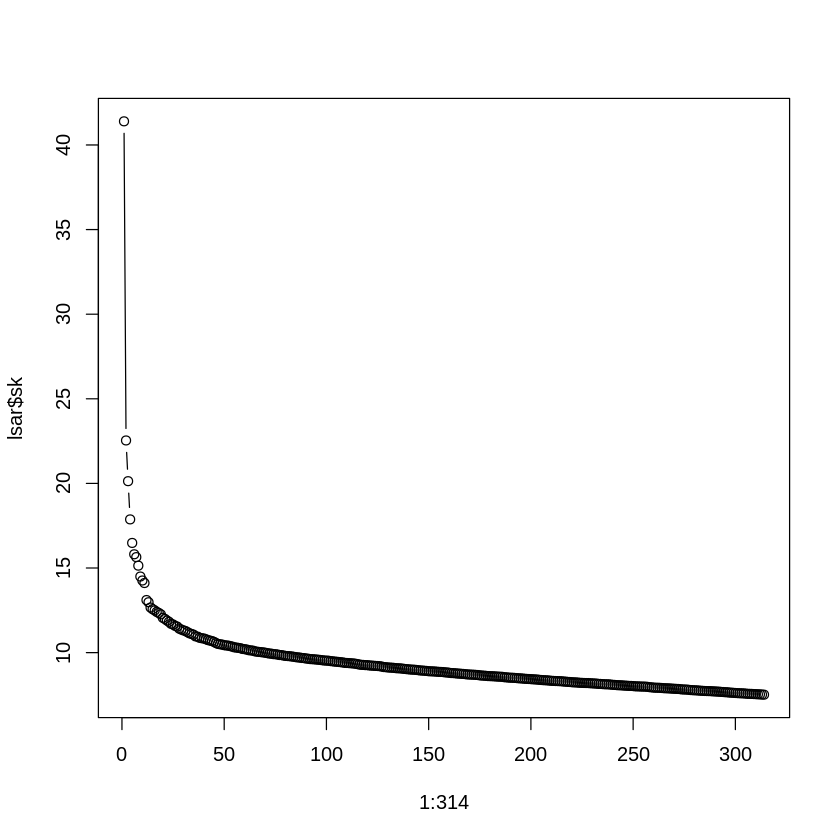

In [25]:
plot(1:314, lsar$sk, type="b")

In [26]:
tls <- lsar$tk %*% diag(lsar$sk)
dls <- lsar$dk %*% diag(lsar$sk)

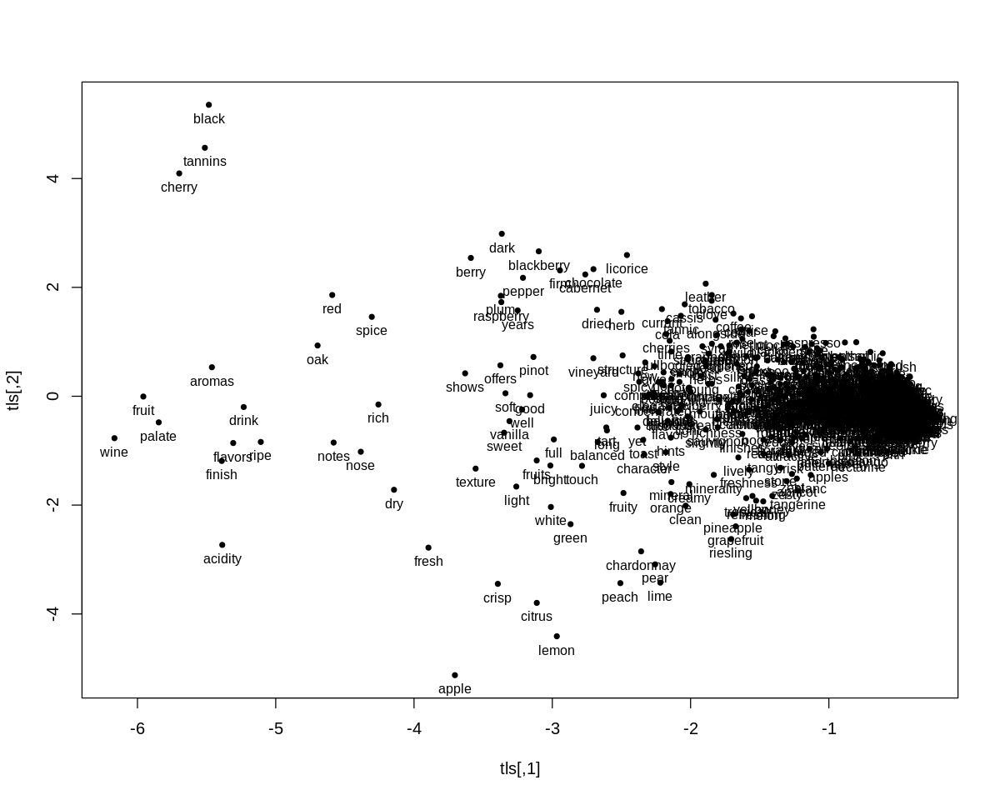

In [27]:
options(repr.plot.width=10, repr.plot.height=8)
plot(tls, pch=20)
text(tls,labels=words, cex=0.8, pos=1)
points(0,0,pch=20,cex=3,col="red")

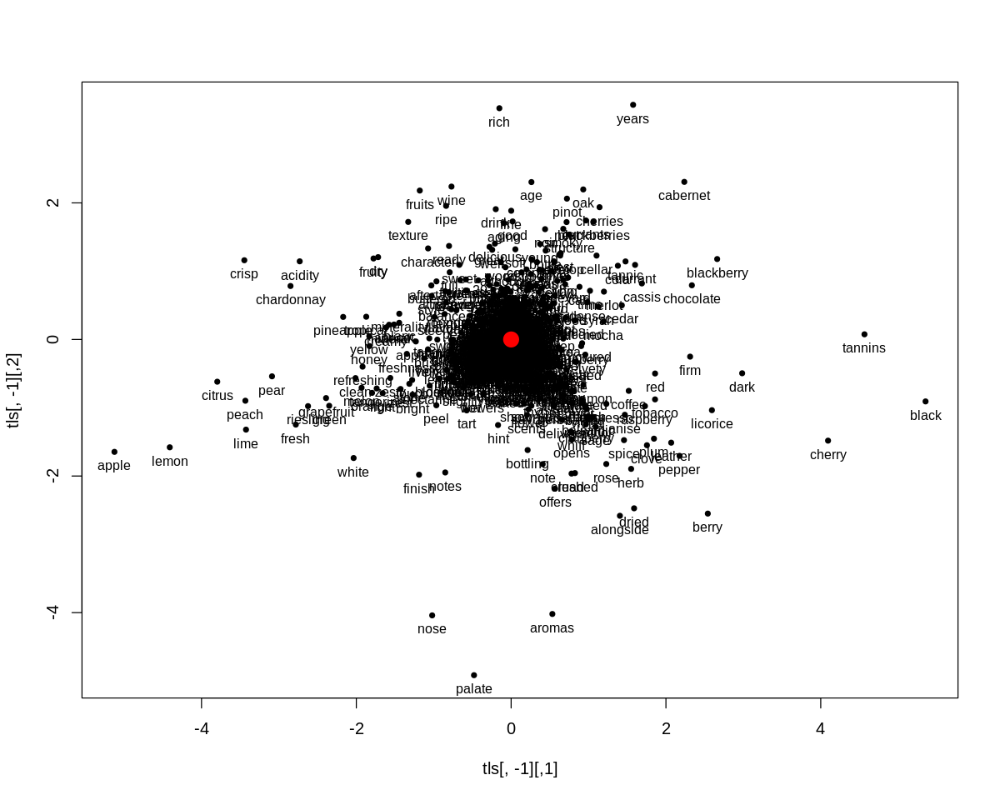

In [28]:
plot(tls[,-1], pch=20)
text(tls[,-1],labels=words, cex=0.8, pos=1)
points(0,0,pch=20,cex=3,col="red")

In [29]:
norm_vec <- function(x) sqrt(sum(x^2))
norma_termini_lsa <- apply(tls, 1, norm_vec)

In [30]:
nrow(tls)

[1] 791

In [31]:
tls_ridotto <- subset(tls, norma_termini_lsa > 5)
words_ridotto <- subset(words, norma_termini_lsa > 5)

In [32]:
nrow(tls_ridotto)

[1] 357

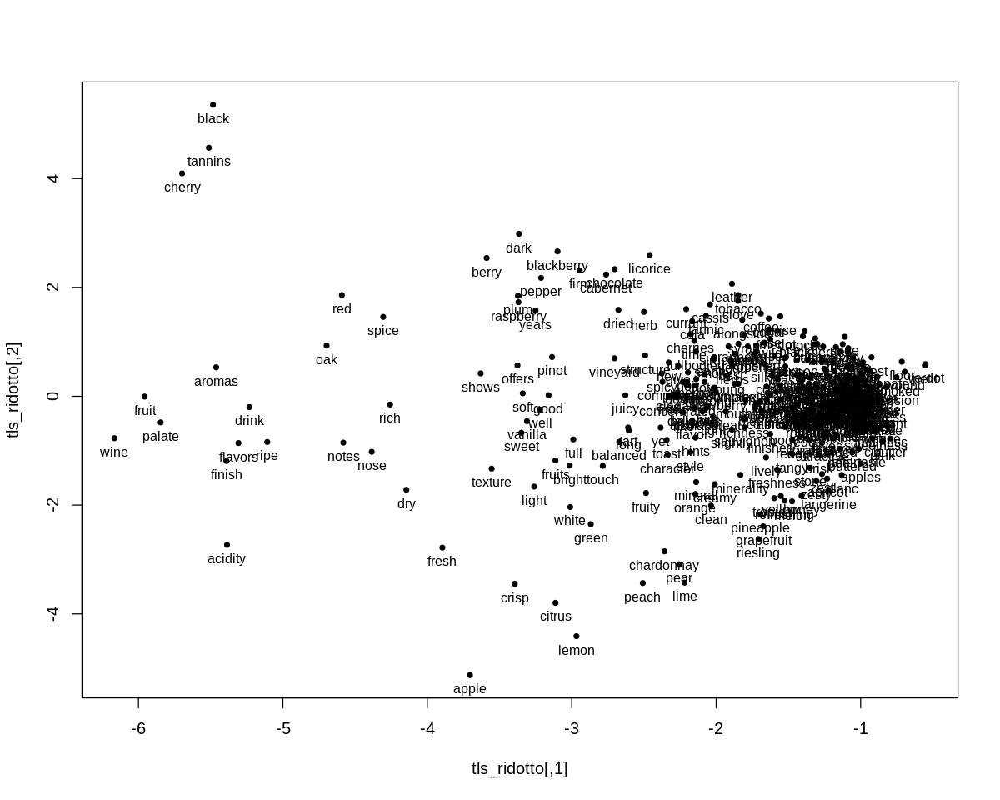

In [33]:
plot(tls_ridotto, pch=20)
text(tls_ridotto,labels=words_ridotto, cex=0.8, pos=1)
points(0,0,pch=20,cex=3,col="red")

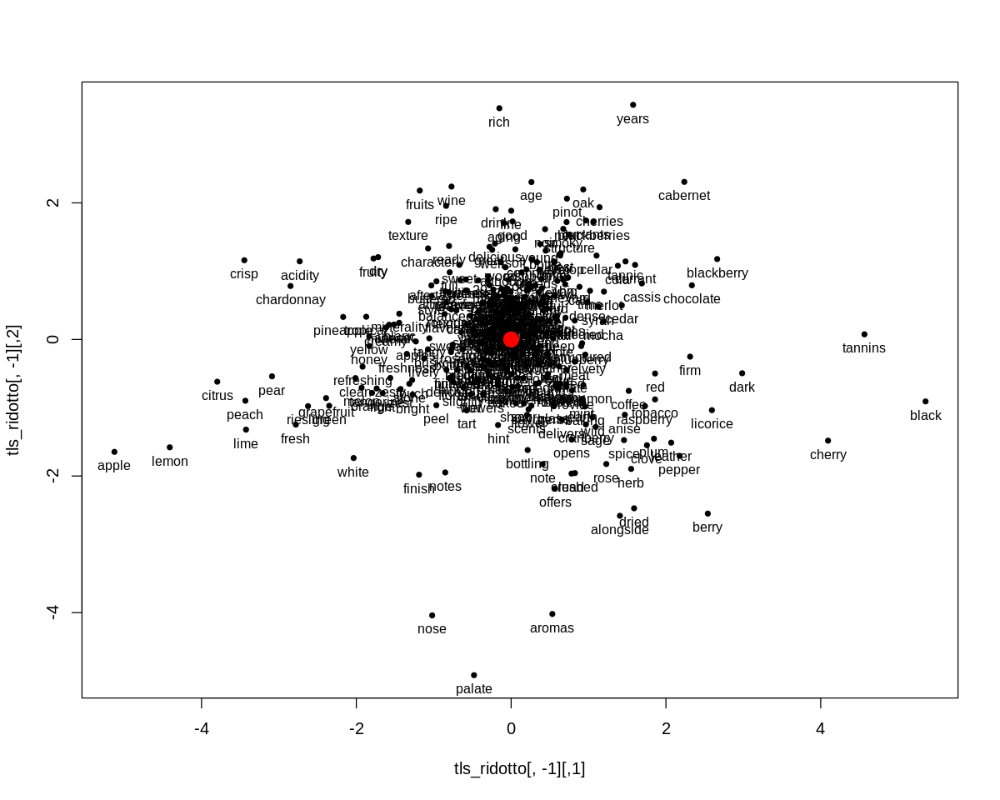

In [34]:
plot(tls_ridotto[,-1], pch=20)
text(tls_ridotto[,-1],labels=words_ridotto, cex=0.8, pos=1)
points(0,0,pch=20,cex=3,col="red")

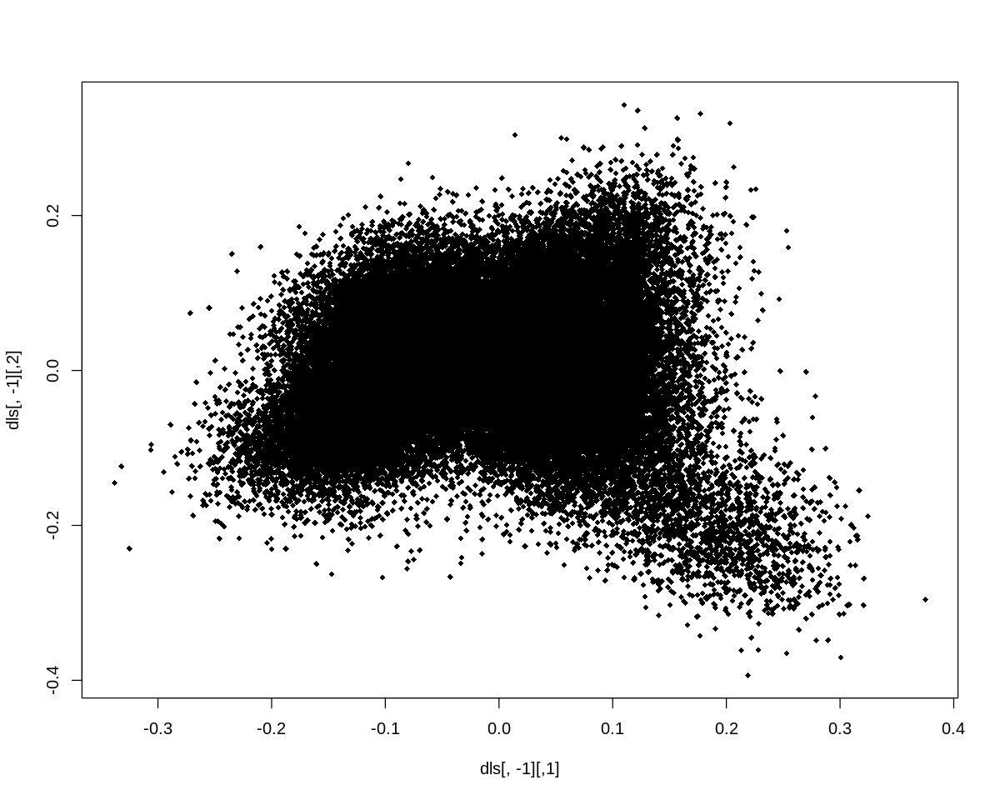

In [35]:
plot( dls[,-1], pch=18, cex=0.8 )

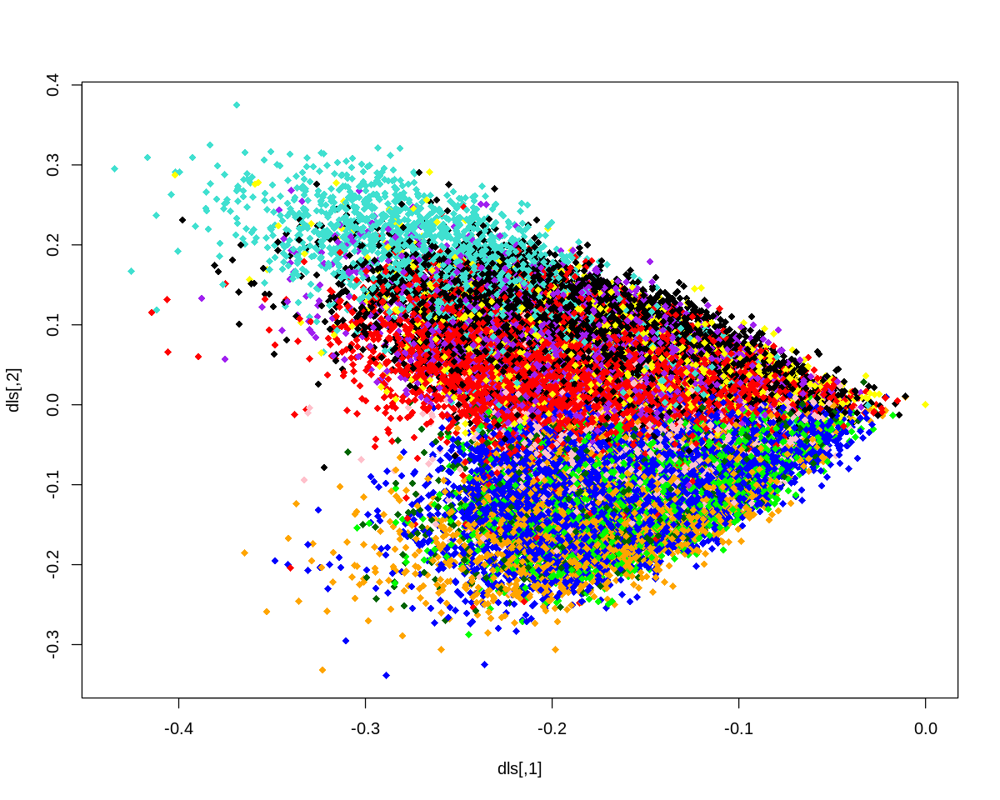

In [36]:
varietycolor <- function(x) switch(x, "Pinot Noir" = "red",
                                      "Chardonnay"="blue", 
                                      "Cabernet Sauvignon"="black", 
                                      "Syrah"="purple", 
                                      "Riesling" = "orange",
                                      "Sauvignon Blanc"="green",
                                      "Nebbiolo"="turquoise",
                                      "Merlot"="yellow",
                                      "Sparkling Blend"="darkgreen",
                                      "Rosé"="pink", 
                                      "grey")
damcols <- sapply(variety, varietycolor)
plot( dls, pch=18, cex=1, col=damcols )

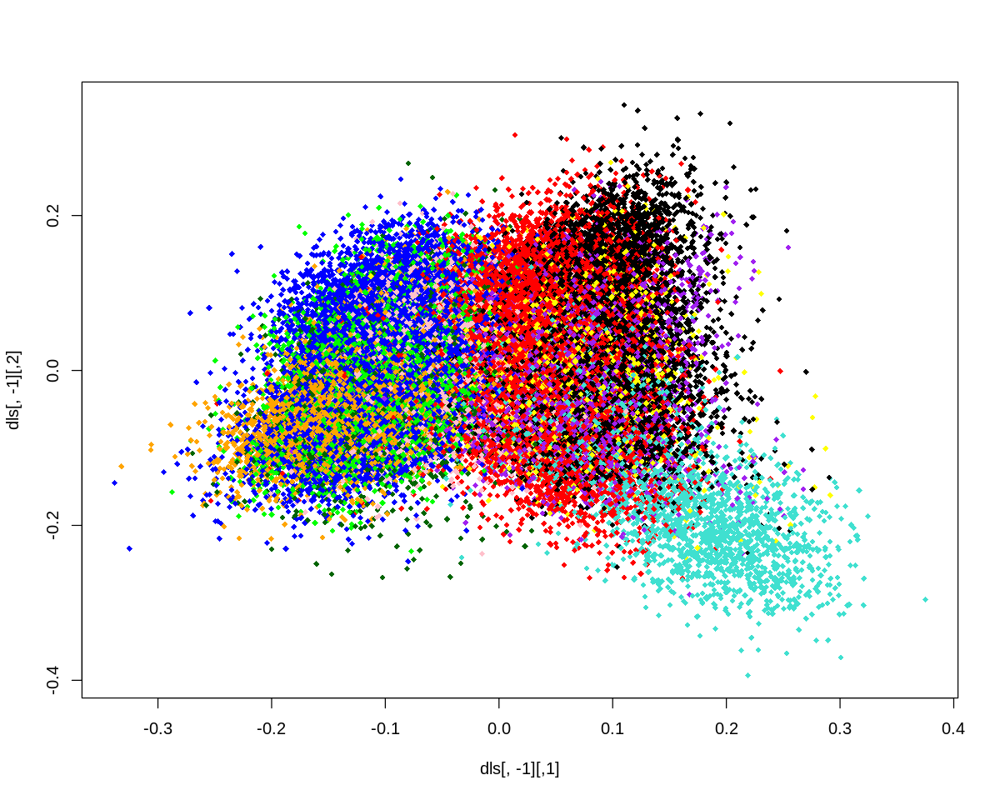

In [37]:
plot( dls[,-1], pch=18, cex=0.8, col=damcols )

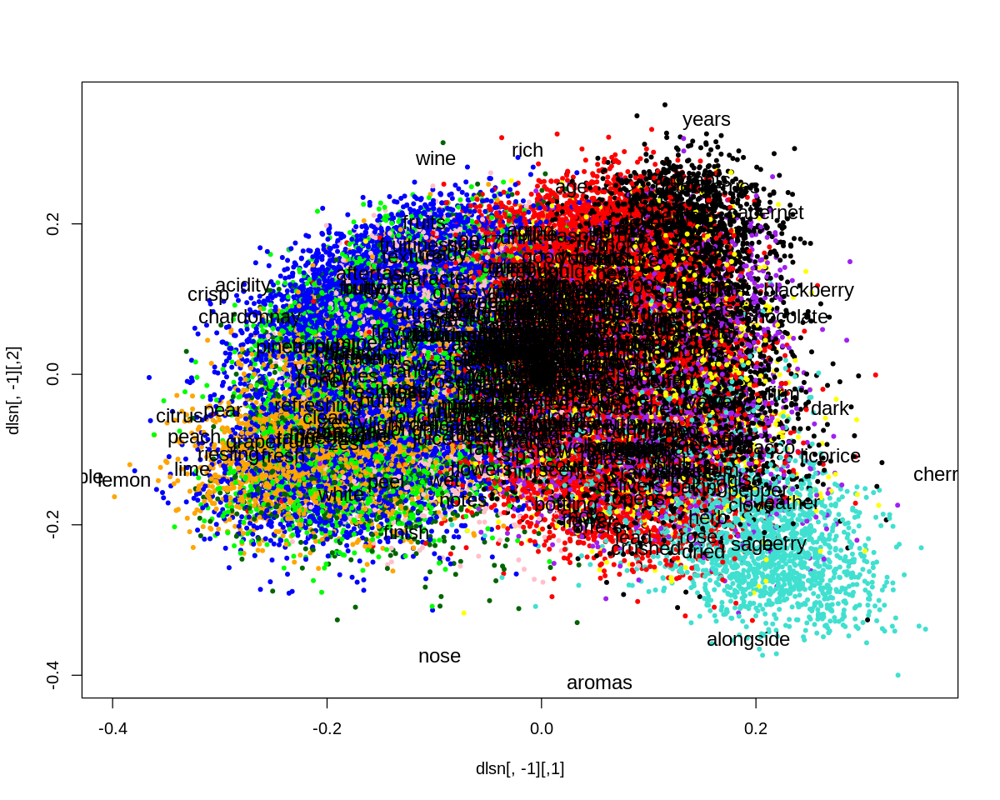

In [38]:
normrows <- function(x) x / apply(x,1,norm,"2")
tlsn_ridotto <- normrows(tls_ridotto)
tlsn <- normrows(tls)
dlsn <- normrows(dls)
plot( dlsn[,-1], pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto[,-1], labels=words_ridotto, cex=1.2 )
points( 0, 0, pch=20, cex=5 )

In [39]:
sage.vs.Nebbiolo <- table( tdm["sage",]>0, variety=="Nebbiolo")
dimnames(sage.vs.Nebbiolo) <- list(sage = c("No", "Si"), Nebbiolo = c("No", "Si"))
chisqtest = chisq.test( sage.vs.Nebbiolo, correct=FALSE )
chisqtest


	Pearson's Chi-squared test

data:  sage.vs.Nebbiolo
X-squared = 2129.1, df = 1, p-value < 2.2e-16


In [40]:
chisqtest$expected
chisqtest$observed

,No,Si
No,53271.5269,2565.47312
Si,758.4731,36.52688


    Nebbiolo
sage    No    Si
  No 53542  2295
  Si   488   307

In [41]:
neighborSage = names (associate(tls[,2:3], "sage", threshold=0.999))

In [42]:
norma_termini_lsa[neighborSage]

menthol    tightly    roasted underbrush      offer       star   balsamic 
  3.086164   6.942487   7.479962   2.424675   1.334451   4.338329   3.177446 
      herb      wound     center  assertive       wild 
  9.981688   5.731993   3.170159   2.230739   8.552776

In [43]:
dried.vs.Nebbiolo <- table( tdm["dried",]>0, variety=="Nebbiolo")
dimnames(dried.vs.Nebbiolo) <- list(dried = c("No", "Si"), Nebbiolo = c("No", "Si"))
chisqtest = chisq.test( dried.vs.Nebbiolo, correct=FALSE )
chisqtest


	Pearson's Chi-squared test

data:  dried.vs.Nebbiolo
X-squared = 1200.4, df = 1, p-value < 2.2e-16


In [44]:
chisqtest$expected
chisqtest$observed

,No,Si
No,51366.281,2473.7195
Si,2663.719,128.2805


     Nebbiolo
dried    No    Si
   No 51740  2100
   Si  2290   502

In [45]:
driedSage.vs.Nebbiolo <- table( tdm["dried",]>0 & tdm["sage",]>0, variety=="Nebbiolo")
dimnames(driedSage.vs.Nebbiolo) <- list(driedSage = c("No", "Si"), Nebbiolo = c("No", "Si"))
chisqtest = chisq.test( driedSage.vs.Nebbiolo, correct=FALSE )
chisqtest


	Pearson's Chi-squared test

data:  driedSage.vs.Nebbiolo
X-squared = 751.77, df = 1, p-value < 2.2e-16


In [46]:
chisqtest$expected
chisqtest$observed

,No,Si
No,53800.0729,2590.92707
Si,229.9271,11.07293


         Nebbiolo
driedSage    No    Si
       No 53889  2502
       Si   141   100

In [47]:
driedSage.Query <- "dried sage"
driedSage.Vector <- query( driedSage.Query, words )
driedSage.VWeight <- lw_logtf(driedSage.Vector) * ( 1-entropy(tdm) )
driedSage.LSA <- t(driedSage.VWeight) %*% lsar$tk
driedSage.LSA[,1:6]

[1] -0.019675267  0.026663510 -0.040813007 -0.005743196 -0.001120843
[6]  0.008258030

In [48]:
cosines <- function(X, Q) apply( X, 1, cosine, as.vector(Q) )
top <- function(X, N) order( X, decreasing=TRUE )[1:N]

In [49]:
top( cosines( dls[,2:3], driedSage.LSA[2:3] ), 10 )
# elenco dei 10 documenti sopra menzionati 
variety[top( cosines( dls[,2:3], driedSage.LSA[2:3] ), 10 )]
#reviews[top(cosines(dls[,2:3], driedSage.LSA[2:3]), 10)]

[1] 27973 20635  2207 45083 42961 34987 49179 53285 24375 23244

[1] "Merlot"     "Syrah"      "Nebbiolo"   "Merlot"     "Syrah"     
 [6] "Nebbiolo"   "Merlot"     "Pinot Noir" "Syrah"      "Pinot Noir"

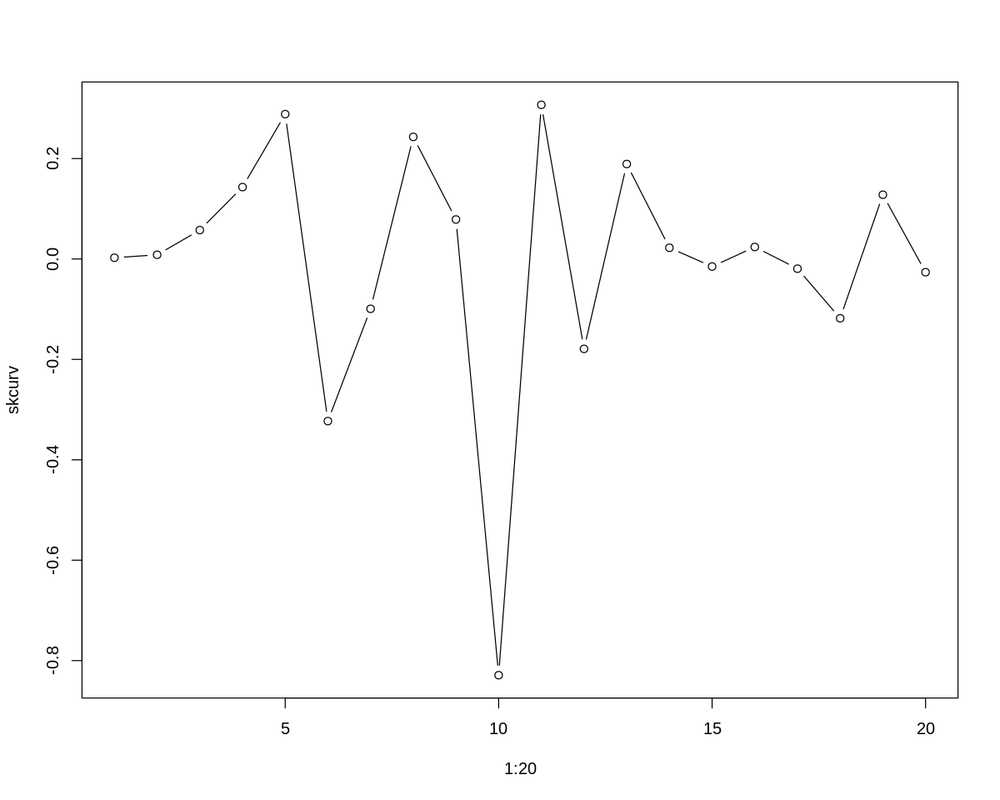

In [50]:
fordiff <- function(x) x[2:length(x)] - x[1:(length(x)-1)]
skd <- fordiff(lsar$sk)
skdd <- fordiff(skd)
skcurv <- skdd[1:20] / (1+(skd[1:20])^2)^1.5
plot( 1:20, skcurv, type="b" )

In [51]:
variety[top( cosines( dls[,1:6], driedSage.LSA[1:6] ), 10 )]
#reviews[top(cosines(dls[,1:6], driedSage.LSA[1:6]), 20)]
head(sort(table(variety[top(cosines(dls[,1:6],driedSage.LSA[1:6]),2602)]), decreasing = T))

[1] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"
 [7] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"


          Nebbiolo         Pinot Noir Cabernet Sauvignon              Syrah 
              1591                330                303                238 
            Merlot               Rosé 
               119                  9 

In [52]:
table(variety[top(cosines(dls[,1:6],driedSage.LSA[1:6]),10)])["Nebbiolo"]/10

Nebbiolo 
       1

In [53]:
table(variety[top(cosines(dls[,1:6],driedSage.LSA[1:6]),50)])["Nebbiolo"]/50

Nebbiolo 
    0.94

In [54]:
table(variety[top(cosines(dls[,1:6],driedSage.LSA[1:6]),100)])["Nebbiolo"]/100

Nebbiolo 
    0.91

In [55]:
table(variety[top(cosines(dls[,1:6],driedSage.LSA[1:6]),500)])["Nebbiolo"]/500

Nebbiolo 
   0.896

In [56]:
table(variety[top(cosines(dls[,1:6],driedSage.LSA[1:6]),1000)])["Nebbiolo"]/1000

Nebbiolo 
   0.827

In [57]:
table(variety[top(cosines(dls[,1:6],driedSage.LSA[1:6]),2602)])["Nebbiolo"]/2602

Nebbiolo 
0.6114527

In [58]:
table(variety)["Nebbiolo"]/length(variety)

Nebbiolo 
0.04594576

In [59]:
table(variety[top(cosines(dls[,1:6],driedSage.LSA[1:6]),2602)])["Nebbiolo"]
table(variety)["Nebbiolo"]/length(variety)*2602 #attesi 

Nebbiolo 
    1591

Nebbiolo 
119.5509

In [60]:
driedSage.vs.Nebbiolo <- table(1:nrow(dls) %in% top(cosines(dls[,1:6], driedSage.LSA[1:6]), 2602), variety=="Nebbiolo" )
dimnames(driedSage.vs.Nebbiolo) <- list(driedSage = c("No", "Si"), Nebbiolo = c("No", "Si"))
driedSage.vs.Nebbiolo

         Nebbiolo
driedSage    No    Si
       No 53019  1011
       Si  1011  1591

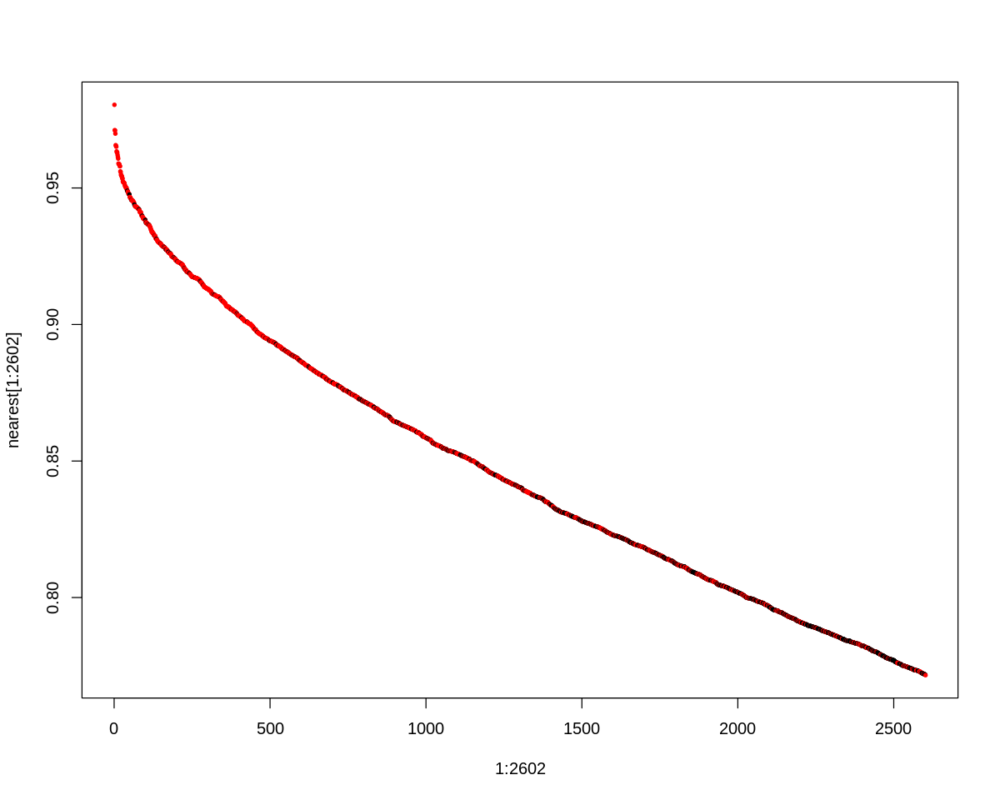

In [61]:
nearest <- sort( cosines( dls[,1:6], driedSage.LSA[1:6] ), decreasing=T )

damcols2 <- rep( "black", length(variety) )
damcols2[ variety == "Nebbiolo" ] <- "red" 

plot( 1:2602, nearest[1:2602], pch=20, cex=0.7, col=damcols2[strtoi(names(nearest))] )

In [62]:
tksrs <- lsar$tk %*% diag( sqrt( lsar$sk ) )
DSdksrs <- driedSage.LSA %*% diag( lsar$sk^-0.5 )

head(sort(cosines( tksrs[,1:6], DSdksrs[1:6] ), decreasing = T), 10)

sage       game       herb      dried        raw       lead      clove 
 0.9684770  0.9449325  0.9316843  0.9291173  0.9274720  0.9255688  0.9192452 
      mint    crushed eucalyptus 
 0.9180379  0.9116633  0.9074896

In [63]:
tnorms4 <- apply( tls[,1:6], 1, norm, "2" )
sort(tnorms4[cosines(tksrs[,1:6],DSdksrs[1:6])>0.9],decreasing = T)

dried       herb    leather      clove    crushed       lead       sage 
 3.9767988  3.6325292  3.4293826  3.2014841  2.9717505  2.9247970  2.1226434 
    violet       mint      floor      wound       game eucalyptus        raw 
 1.9446999  1.8130705  1.2417683  1.0870394  1.0089264  0.9423341  0.8964706

In [64]:
makequery <- function(Q, TDM, LSA) {
  V <- query( Q, rownames(TDM) )
  W <- lw_logtf(V) * (1-entropy(TDM))
  LS <- t(W) %*% LSA$tk
  DK <- LS %*% diag(LSA$sk^-1)
  DKSRS <- DK %*% diag(sqrt(LSA$sk))
  list( query=Q, bin=V, v=W, dk=DK, ls=LS, dksrs=DKSRS )
}

In [359]:
NebbioloQuery <- makequery( "dried sage herb", tdm, lsar )
variety[top(cosines(dls[,1:6],NebbioloQuery$ls[1:6]),10)]
#reviews[top(cosines(dls[,1:6],NebbioloQuery$ls[1:6]),10)]
head(sort(table( variety[ top( cosines( dls[,1:6], NebbioloQuery$ls[1:6] ), 2602 ) ] ), decreasing = T))

[1] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"
 [7] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"


          Nebbiolo Cabernet Sauvignon         Pinot Noir              Syrah 
              1703                281                275                213 
            Merlot    Sparkling Blend 
               109                  9 

In [362]:
head(sort(cosines( tksrs[,1:6], NebbioloQuery$dksrs[1:6] ), decreasing = T),10)

sage      game      herb     clove    violet   crushed   leather      lead 
0.9840746 0.9656906 0.9492424 0.9451290 0.9322719 0.9301341 0.9293311 0.9267990 
    wound      blue 
0.9244763 0.9240896

In [365]:
sort(tnorms4[cosines(tksrs[,1:6],NebbioloQuery$dksrs[1:6])>0.9],decreasing = T)

berry      dried       herb    leather      clove    crushed       lead 
 5.4599139  3.9767988  3.6325292  3.4293826  3.2014841  2.9717505  2.9247970 
   menthol       sage     violet       mint underbrush       blue      floor 
 2.1310878  2.1226434  1.9446999  1.8130705  1.7401091  1.4215476  1.2417683 
     wound       game        raw     emerge 
 1.0870394  1.0089264  0.8964706  0.8903071

In [371]:
NebbioloQuery <- makequery( "dried herb sage berry", tdm, lsar )
variety[top(cosines(dls[,1:6],NebbioloQuery$ls[1:6]),10)]
#reviews[top(cosines(dls[,1:6],NebbioloQuery$ls[1:6]),10)]
head(sort(table( variety[ top( cosines( dls[,1:6], NebbioloQuery$ls[1:6] ), 2602 ) ] ),decreasing = T))

[1] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"
 [7] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"


          Nebbiolo         Pinot Noir Cabernet Sauvignon              Syrah 
              1783                254                252                202 
            Merlot    Sparkling Blend 
                97                  7 

In [372]:
sort(cosines( tksrs[,1:6], NebbioloQuery$dksrs[1:6] ), decreasing = T)[1:10]

sage      game     clove    violet   menthol      herb      blue   leather 
0.9907466 0.9801265 0.9653871 0.9599410 0.9546597 0.9537237 0.9531171 0.9519051 
   emerge     berry 
0.9491163 0.9463268

In [374]:
sort(tnorms4[cosines(tksrs[,1:6],NebbioloQuery$dksrs[1:6])>0.95],decreasing = T)

herb  leather    clove  menthol     sage   violet     blue     game 
3.632529 3.429383 3.201484 2.131088 2.122643 1.944700 1.421548 1.008926

In [383]:
NebbioloQuery <- makequery( "herb sage berry leather", tdm, lsar )
variety[top(cosines(dls[,1:6],NebbioloQuery$ls[1:6]),10)]
#reviews[top(cosines(dls[,1:6],NebbioloQuery$ls[1:6]),10)]
head(sort(table( variety[ top( cosines( dls[,1:6], NebbioloQuery$ls[1:6] ), 2602 ) ] ), decreasing = T))

[1] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"
 [7] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"


          Nebbiolo Cabernet Sauvignon         Pinot Noir              Syrah 
              1868                241                208                175 
            Merlot               Rosé 
                94                  7 

In [384]:
sort(cosines( tksrs[,1:6], NebbioloQuery$dksrs[1:6] ), decreasing = T)[1:10]

menthol        blue        sage        game  underbrush finegrained 
  0.9861002   0.9807616   0.9763072   0.9761052   0.9747017   0.9714313 
      clove   assertive     leather      violet 
  0.9713930   0.9681351   0.9671007   0.9662419

In [386]:
sort(tnorms4[cosines(tksrs[,1:6],NebbioloQuery$dksrs[1:6])>0.97],decreasing = T)

clove     menthol        sage  underbrush finegrained        blue 
   3.201484    2.131088    2.122643    1.740109    1.665024    1.421548 
       game 
   1.008926

In [396]:
NebbioloQuery <- makequery( "herb sage berry leather menthol", tdm, lsar )
variety[top(cosines(dls[,1:6],NebbioloQuery$ls[1:6]),10)]
#reviews[top(cosines(dls[,1:6],NebbioloQuery$ls[1:6]),10)]
head(sort(table( variety[ top( cosines( dls[,1:6], NebbioloQuery$ls[1:6] ), 2602 ) ] ),decreasing = T))

[1] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"
 [7] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"


          Nebbiolo Cabernet Sauvignon         Pinot Noir              Syrah 
              1887                220                211                169 
            Merlot               Rosé 
                92                  9 

In [397]:
sort(cosines( tksrs[,1:6], NebbioloQuery$dksrs[1:6] ), decreasing = T)[1:10]

menthol  underbrush finegrained        blue   assertive    balsamic 
  0.9925292   0.9862081   0.9807596   0.9805098   0.9803367   0.9766164 
      whiff   alongside        star        game 
  0.9656336   0.9655199   0.9652787   0.9645802

In [398]:
sort(tnorms4[cosines(tksrs[,1:6],NebbioloQuery$dksrs[1:6])>0.96],decreasing = T)

alongside       clove       whiff    balsamic     menthol        sage 
  4.4128288   3.2014841   2.4041741   2.2429581   2.1310878   2.1226434 
     violet  underbrush finegrained        star   assertive        blue 
  1.9446999   1.7401091   1.6650242   1.6448981   1.5867857   1.4215476 
       game      emerge 
  1.0089264   0.8903071

In [406]:
NebbioloQuery <- makequery( "leather menthol", tdm, lsar )
variety[top(cosines(dls[,1:6],NebbioloQuery$ls[1:6]),10)]
#reviews[top(cosines(dls[,1:6],NebbioloQuery$ls[1:6]),10)]
head(sort(table( variety[ top( cosines( dls[,1:6], NebbioloQuery$ls[1:6] ), 2602 ) ] ), decreasing = T))

[1] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"
 [7] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"


          Nebbiolo Cabernet Sauvignon         Pinot Noir              Syrah 
              1930                218                177                154 
            Merlot    Sparkling Blend 
                95                 13 

In [407]:
sort(cosines( tksrs[,1:6], NebbioloQuery$dksrs[1:6] ), decreasing = T)[1:10]

underbrush finegrained     menthol   assertive    balsamic        blue 
  0.9934616   0.9893916   0.9888461   0.9873488   0.9863998   0.9710844 
  alongside        star       whiff     provide 
  0.9688846   0.9686443   0.9679815   0.9581558

In [408]:
sort(tnorms4[cosines(tksrs[,1:6],NebbioloQuery$dksrs[1:6])>0.95],decreasing = T)

alongside       whiff    balsamic     menthol     provide  underbrush 
   4.412829    2.404174    2.242958    2.131088    1.837189    1.740109 
finegrained        star   assertive        blue    nebbiolo      barolo 
   1.665024    1.644898    1.586786    1.421548    1.207625    1.166866

In [409]:
table(variety[top(cosines(dls[,1:6],NebbioloQuery$ls[1:6]),2602)])["Nebbiolo"]/2602

Nebbiolo 
0.7417371

In [415]:
NebbioloQuery <- makequery( "leather menthol balsamic", tdm, lsar )
variety[top(cosines(dls[,1:6],NebbioloQuery$ls[1:6]),10)]
#reviews[top(cosines(dls[,1:6],NebbioloQuery$ls[1:6]),10)]
head(sort(table( variety[ top( cosines( dls[,1:6], NebbioloQuery$ls[1:6] ), 2602 ) ] ), decreasing = T))

[1] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"
 [7] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"


          Nebbiolo Cabernet Sauvignon         Pinot Noir              Syrah 
              1949                194                174                139 
            Merlot    Sparkling Blend 
                89                 32 

In [417]:
sort(cosines( tksrs[,1:6], NebbioloQuery$dksrs[1:6] ), decreasing = T)[1:10]

underbrush    balsamic   assertive finegrained     menthol   alongside 
  0.9947177   0.9929425   0.9903746   0.9875477   0.9842405   0.9759853 
       star       whiff    nebbiolo        blue 
  0.9758095   0.9743767   0.9633050   0.9563574

In [418]:
sort(tnorms4[cosines(tksrs[,1:6],NebbioloQuery$dksrs[1:6])>0.9],decreasing = T)

alongside     leather       clove       opens       anise       whiff 
  4.4128288   3.4293826   3.2014841   2.8439180   2.6667109   2.4041741 
   delivers    balsamic      baking     menthol      violet     provide 
  2.3993978   2.2429581   2.2358723   2.1310878   1.9446999   1.8371889 
 underbrush      flower finegrained        star   assertive     tightly 
  1.7401091   1.7274089   1.6650242   1.6448981   1.5867857   1.5181110 
     mature        blue    nebbiolo      barolo        game     support 
  1.5143212   1.4215476   1.2076253   1.1668665   1.0089264   0.9746215 
     emerge 
  0.8903071

In [441]:
NebbioloQuery <- makequery( "leather menthol balsamic finegrained", tdm, lsar )
variety[top(cosines(dls[,1:6],NebbioloQuery$ls[1:6]),10)]
#reviews[top(cosines(dls[,1:6],NebbioloQuery$ls[1:6]),10)]
head(sort(table( variety[ top( cosines( dls[,1:6], NebbioloQuery$ls[1:6] ), 2602 ) ] ), decreasing = T))

[1] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"
 [7] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"


          Nebbiolo Cabernet Sauvignon         Pinot Noir              Syrah 
              1957                189                171                136 
            Merlot    Sparkling Blend 
                87                 35 

In [442]:
sort(cosines( tksrs[,1:6], NebbioloQuery$dksrs[1:6] ), decreasing = T)[1:10]

underbrush    balsamic   assertive finegrained     menthol   alongside 
  0.9932204   0.9922853   0.9893734   0.9865129   0.9809005   0.9749950 
       star       whiff    nebbiolo     provide 
  0.9744001   0.9734177   0.9628450   0.9530491

In [445]:
sort(tnorms4[cosines(tksrs[,1:6],NebbioloQuery$dksrs[1:6])>0.95],decreasing = T)

alongside       whiff    balsamic     menthol     provide  underbrush 
   4.412829    2.404174    2.242958    2.131088    1.837189    1.740109 
finegrained        star   assertive        blue    nebbiolo      barolo 
   1.665024    1.644898    1.586786    1.421548    1.207625    1.166866

In [457]:
NebbioloQuery <- makequery( "leather balsamic finegrained", tdm, lsar )
variety[top(cosines(dls[,1:6],NebbioloQuery$ls[1:6]),10)]
#reviews[top(cosines(dls[,1:6],NebbioloQuery$ls[1:6]),10)]
head(sort(table( variety[ top( cosines( dls[,1:6], NebbioloQuery$ls[1:6] ), 2602 ) ] ),decreasing = T))

[1] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"
 [7] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"


          Nebbiolo Cabernet Sauvignon         Pinot Noir              Syrah 
              1964                197                168                135 
            Merlot    Sparkling Blend 
                86                 28 

In [459]:
sort(cosines( tksrs[,1:6], NebbioloQuery$dksrs[1:6] ), decreasing = T)[1:10]

underbrush    balsamic   assertive finegrained     menthol        star 
  0.9926400   0.9913967   0.9885368   0.9881416   0.9804999   0.9728272 
  alongside       whiff    nebbiolo     provide 
  0.9717298   0.9706239   0.9616343   0.9550774

In [471]:
sort(tnorms4[cosines(tksrs[,1:6],NebbioloQuery$dksrs[1:6])>0.9],decreasing = T)

alongside       opens       whiff    delivers    balsamic      baking 
  4.4128288   2.8439180   2.4041741   2.3993978   2.2429581   2.2358723 
    menthol      violet     provide  underbrush      flower finegrained 
  2.1310878   1.9446999   1.8371889   1.7401091   1.7274089   1.6650242 
       star   assertive      mature        blue    nebbiolo      barolo 
  1.6448981   1.5867857   1.5143212   1.4215476   1.2076253   1.1668665 
    support      emerge 
  0.9746215   0.8903071

In [485]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:6],NebbioloQuery$dksrs[1:6])>0.6],decreasing = T))) {
  NebbioloQuery <- makequery( paste("leather balsamic finegrained ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:6], NebbioloQuery$ls[1:6] ), 2602 ) ] )["Nebbiolo"]
  if(n>1965) {
    print(paste(newWord,":", n ))
  }
}

[1] "firm : 1981"
[1] "structured : 1974"
[1] "provide : 1968"
[1] "polished : 1970"
[1] "together : 1972"
[1] "grilled : 1970"
[1] "already : 1972"
[1] "refined : 1968"
[1] "firmly : 1967"
[1] "finesse : 1968"
[1] "succulent : 1967"
[1] "stage : 1968"


In [503]:
NebbioloQuery <- makequery( "leather balsamic finegrained firm grilled", tdm, lsar )
variety[top(cosines(dls[,1:6],NebbioloQuery$ls[1:6]),10)]
#reviews[top(cosines(dls[,1:6],NebbioloQuery$ls[1:6]),10)]
head(sort(table( variety[ top( cosines( dls[,1:6], NebbioloQuery$ls[1:6] ), 2602 ) ] ),decreasing = T))

[1] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"
 [7] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"


          Nebbiolo Cabernet Sauvignon         Pinot Noir              Syrah 
              1985                204                158                135 
            Merlot    Sparkling Blend 
                91                 13 

In [504]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:6],NebbioloQuery$dksrs[1:6])>0.6],decreasing = T))) {
  NebbioloQuery <- makequery( paste("leather balsamic finegrained firm grilled ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:6], NebbioloQuery$ls[1:6] ), 2602 ) ] )["Nebbiolo"]
  if(n>1983) {
    print(paste(newWord,":", n ))
  }
}

[1] "spice : 1985"
[1] "together : 1987"
[1] "grilled : 1986"
[1] "tightly : 1985"
[1] "exotic : 1986"
[1] "barolo : 1984"
[1] "support : 1985"
[1] "take : 1984"
[1] "finesse : 1988"
[1] "succulent : 1988"
[1] "drying : 1984"
[1] "suggesting : 1986"
[1] "austere : 1984"
[1] "slowly : 1984"
[1] "center : 1984"
[1] "loaded : 1985"


In [82]:
NebbioloQuery <- makequery( "leather balsamic finegrained firm grilled succulent", tdm, lsar )
variety[top(cosines(dls[,1:6],NebbioloQuery$ls[1:6]),10)]
#reviews[top(cosines(dls[,1:6],NebbioloQuery$ls[1:6]),10)]
head(sort(table( variety[ top( cosines( dls[,1:6], NebbioloQuery$ls[1:6] ), 2602 ) ] ),decreasing = T))

[1] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"
 [7] "Nebbiolo" "Nebbiolo" "Nebbiolo" "Nebbiolo"


          Nebbiolo Cabernet Sauvignon         Pinot Noir              Syrah 
              1988                199                165                129 
            Merlot    Sparkling Blend 
                90                 14 

In [83]:
sort(cosines( tksrs[,1:6], NebbioloQuery$dksrs[1:6] ), decreasing = T)[1:10]

finegrained    balsamic  underbrush   assertive      barolo     menthol 
  0.9863314   0.9808263   0.9786449   0.9773222   0.9729905   0.9638227 
       star     provide    nebbiolo       whiff 
  0.9628752   0.9622903   0.9578385   0.9548889

In [84]:
sort(tnorms4[cosines(tksrs[,1:6],NebbioloQuery$dksrs[1:6])>0.95],decreasing = T)

alongside       whiff    balsamic     menthol     provide  underbrush 
   4.412829    2.404174    2.242958    2.131088    1.837189    1.740109 
finegrained        star   assertive      mature    nebbiolo      barolo 
   1.665024    1.644898    1.586786    1.514321    1.207625    1.166866

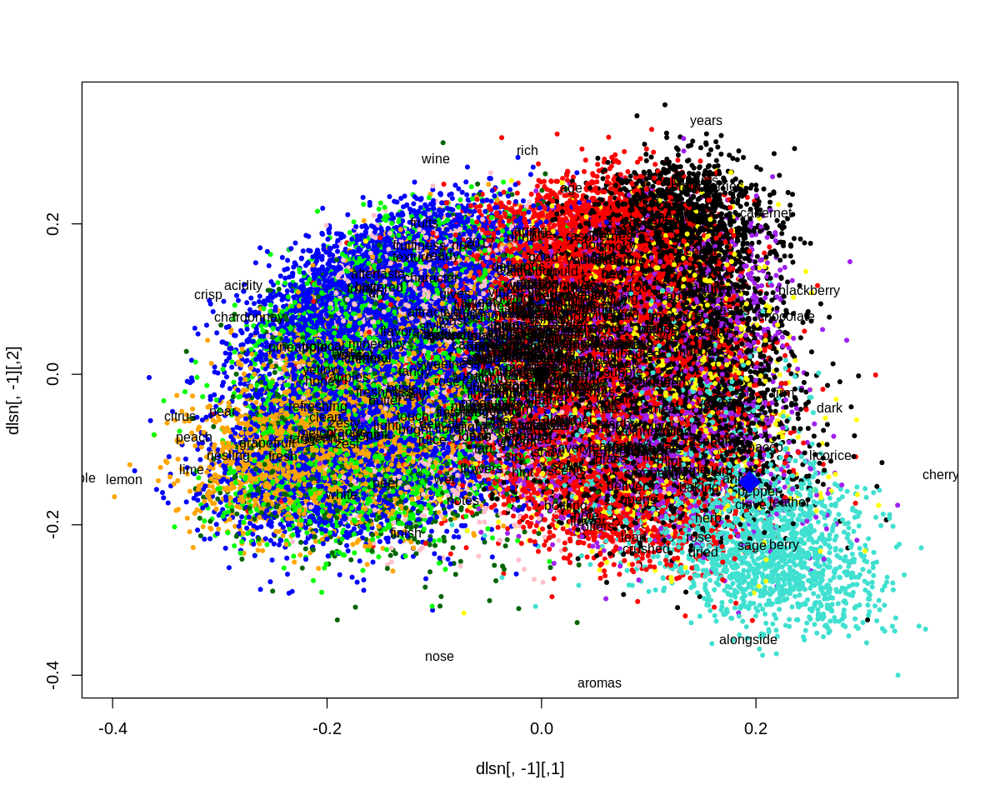

In [85]:
plot( dlsn[,-1], pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto[,-1], labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(NebbioloQuery$ls)[2],normrows(NebbioloQuery$ls)[3],cex=3,pch=18,col="blue")

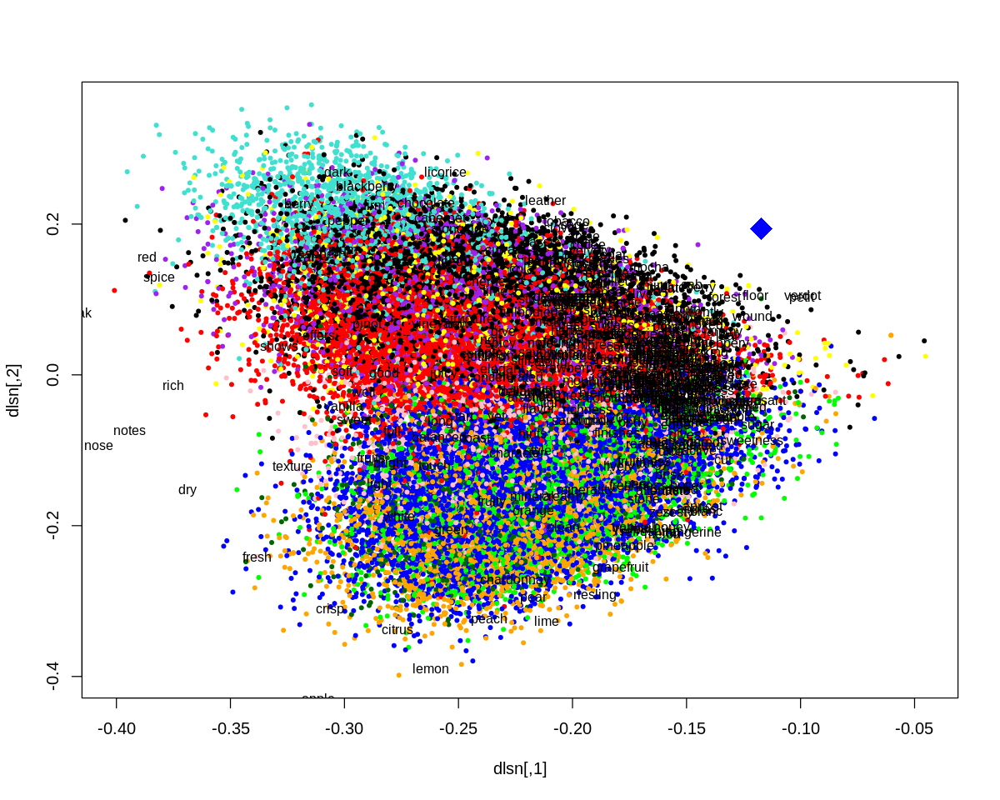

In [86]:
plot( dlsn, pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto, labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(NebbioloQuery$ls),cex=3,pch=18,col="blue")

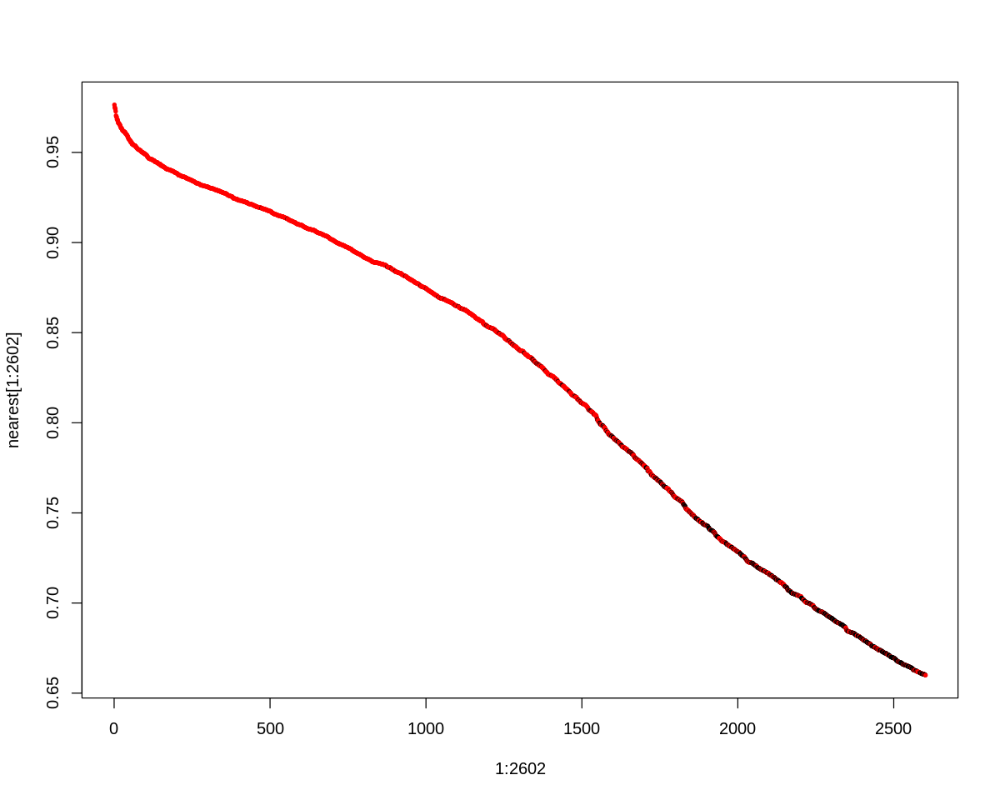

In [87]:
nearest <- sort( cosines( dls[,1:6], NebbioloQuery$ls[1:6] ), decreasing=T )

damcols2 <- rep( "black", length(variety) )
damcols2[ variety == "Nebbiolo" ] <- "red" 

plot( 1:2602, nearest[1:2602], pch=20, cex=0.7, col=damcols2[strtoi(names(nearest))] )

In [88]:
table(variety[top(cosines(dls[,1:6],NebbioloQuery$ls[1:6]),2602)])["Nebbiolo"]/2602

Nebbiolo 
0.7640277

In [89]:
NebbioloQuery.vs.Nebbiolo <- table(1:nrow(dls) %in% top(cosines(dls[,1:6], NebbioloQuery$ls[1:6]), 2602), variety=="Nebbiolo" )
dimnames(NebbioloQuery.vs.Nebbiolo) <- list(NebbioloQuery = c("No", "Si"), NebbioloClass = c("No", "Si"))
NebbioloQuery.vs.Nebbiolo

c = chisq.test( NebbioloQuery.vs.Nebbiolo, correct=FALSE )
c$expected
c$p.value

             NebbioloClass
NebbioloQuery    No    Si
           No 53416   614
           Si   614  1988

,No,Si
No,51547.551,2482.4491
Si,2482.449,119.5509


[1] 0

In [92]:
raspberries.vs.PinotNoir <- table( tdm["raspberries",]>0, variety=="Pinot Noir")
dimnames(raspberries.vs.PinotNoir) <- list(raspberries = c("No", "Si"), PinotNoir = c("No", "Si"))
chisqtest = chisq.test( raspberries.vs.PinotNoir, correct=FALSE )
chisqtest
chisqtest$expected
chisqtest$observed


	Pearson's Chi-squared test

data:  raspberries.vs.PinotNoir
X-squared = 1070.3, df = 1, p-value < 2.2e-16


,No,Si
No,43568.6527,12059.3473
Si,786.3473,217.6527


           PinotNoir
raspberries    No    Si
         No 43992 11636
         Si   363   641

In [93]:
table(variety)["Pinot Noir"]/length(variety)

Pinot Noir 
 0.2167856

In [94]:
PinotNoirQuery <- makequery( "raspberries", tdm, lsar )
variety[top(cosines(dls[,1:6],PinotNoirQuery$ls[1:6]),10)]
#reviews[top(cosines(dls[,1:6],PinotNoirQuery$ls[1:6]),10)]
table( variety[ top( cosines( dls[,1:6], PinotNoirQuery$ls[1:6] ), 12277 ) ] )["Pinot Noir"]

[1] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"
 [6] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Rosé"

Pinot Noir 
      6105

In [95]:
sort(cosines( tksrs[,1:6], PinotNoirQuery$dksrs[1:6] ), decreasing = T)[1:10]

raspberries       pinot        noir       silky        cola  sandalwood 
  0.9819385   0.9744166   0.9742652   0.9650900   0.9323072   0.9316733 
   cherries      pinots     coastal        want 
  0.9118979   0.8971003   0.8297071   0.8197085

In [96]:
sort(tnorms4[cosines(tksrs[,1:6],PinotNoirQuery$dksrs[1:6])>0.9],decreasing = T)

pinot        noir        cola    cherries       silky raspberries 
   8.668070    6.793768    4.360817    4.100942    3.690613    2.522403 
 sandalwood 
   1.677934

In [98]:
PinotNoirQuery <- makequery( "raspberries cola", tdm, lsar )
variety[top(cosines(dls[,1:6],PinotNoirQuery$ls[1:6]),10)]
#reviews[top(cosines(dls[,1:6],PinotNoirQuery$ls[1:6]),10)]
table( variety[ top( cosines( dls[,1:6], PinotNoirQuery$ls[1:6] ), 12277 ) ] )["Pinot Noir"]

[1] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"
 [6] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"

Pinot Noir 
      6577

In [99]:
sort(cosines( tksrs[,1:6], PinotNoirQuery$dksrs[1:6] ), decreasing = T)[1:10]

pinot        noir       silky raspberries        cola  sandalwood 
  0.9844142   0.9839253   0.9817977   0.9695401   0.9655914   0.9649897 
   cherries      pinots     coastal    mushroom 
  0.9169267   0.9093101   0.8368807   0.8082063

In [100]:
sort(tnorms4[cosines(tksrs[,1:6],PinotNoirQuery$dksrs[1:6])>0.9],decreasing = T)

pinot        noir        cola    cherries       silky raspberries 
  8.6680704   6.7937683   4.3608169   4.1009418   3.6906126   2.5224034 
 sandalwood      pinots 
  1.6779341   0.7196405

In [102]:
PinotNoirQuery <- makequery( "raspberries cola silky", tdm, lsar )
variety[top(cosines(dls[,1:6],PinotNoirQuery$ls[1:6]),10)]
#reviews[top(cosines(dls[,1:6],PinotNoirQuery$ls[1:6]),10)]
table( variety[ top( cosines( dls[,1:6], PinotNoirQuery$ls[1:6] ), 12277 ) ] )["Pinot Noir"]

[1] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"
 [6] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"

Pinot Noir 
      6682

In [103]:
sort(cosines( tksrs[,1:6], PinotNoirQuery$dksrs[1:6] ), decreasing = T)[1:10]

noir       pinot       silky raspberries        cola  sandalwood 
  0.9902504   0.9898727   0.9842749   0.9621500   0.9600671   0.9577774 
   cherries      pinots     coastal    mushroom 
  0.8979315   0.8929330   0.8395528   0.8150303

In [104]:
sort(tnorms4[cosines(tksrs[,1:6],PinotNoirQuery$dksrs[1:6])>0.94],decreasing = T)

pinot        noir        cola       silky raspberries  sandalwood 
   8.668070    6.793768    4.360817    3.690613    2.522403    1.677934

In [105]:
PinotNoirQuery <- makequery( "raspberries cola silky sandalwood", tdm, lsar )
variety[top(cosines(dls[,1:6],PinotNoirQuery$ls[1:6]),10)]
#reviews[top(cosines(dls[,1:6],PinotNoirQuery$ls[1:6]),10)]
table( variety[ top( cosines( dls[,1:6], PinotNoirQuery$ls[1:6] ), 12277 ) ] )["Pinot Noir"]

[1] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"
 [6] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"

Pinot Noir 
      6712

In [106]:
sort(cosines( tksrs[,1:6], PinotNoirQuery$dksrs[1:6] ), decreasing = T)[1:10]

noir       pinot       silky        cola  sandalwood raspberries 
  0.9885161   0.9881468   0.9837893   0.9639046   0.9628494   0.9603630 
   cherries      pinots     coastal    mushroom 
  0.9019434   0.8970413   0.8379907   0.8200642

In [107]:
sort(tnorms4[cosines(tksrs[,1:6],PinotNoirQuery$dksrs[1:6])>0.94],decreasing = T)

pinot        noir        cola       silky raspberries  sandalwood 
   8.668070    6.793768    4.360817    3.690613    2.522403    1.677934

In [110]:
PinotNoirQuery <- makequery( "cola silky sandalwood", tdm, lsar )
variety[top(cosines(dls[,1:6],PinotNoirQuery$ls[1:6]),10)]
#reviews[top(cosines(dls[,1:6],PinotNoirQuery$ls[1:6]),10)]
head(sort(table( variety[ top( cosines( dls[,1:6], PinotNoirQuery$ls[1:6] ), 12277 ) ] ), decreasing = T))

[1] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"
 [6] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"


        Pinot Noir Cabernet Sauvignon               Rosé              Syrah 
              6866               1398                950                934 
            Merlot    Sparkling Blend 
               832                584 

In [111]:
sort(cosines( tksrs[,1:6], PinotNoirQuery$dksrs[1:6] ), decreasing = T)[1:10]

noir       pinot       silky        cola  sandalwood raspberries 
  0.9860844   0.9855608   0.9827297   0.9668650   0.9656901   0.9473322 
   cherries      pinots    mushroom     coastal 
  0.8928102   0.8909219   0.8395070   0.8347857

In [112]:
sort(tnorms4[cosines(tksrs[,1:6],PinotNoirQuery$dksrs[1:6])>0.9],decreasing = T)

pinot        noir        cola       silky raspberries  sandalwood 
   8.668070    6.793768    4.360817    3.690613    2.522403    1.677934

In [120]:
PinotNoirQuery <- makequery( "sandalwood cola silky mushroom", tdm, lsar )
variety[top(cosines(dls[,1:6],PinotNoirQuery$ls[1:6]),10)]
#reviews[top(cosines(dls[,1:6],PinotNoirQuery$ls[1:6]),10)]
table( variety[ top( cosines( dls[,1:6], PinotNoirQuery$ls[1:6] ), 12277 ) ] )["Pinot Noir"]

[1] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"
 [6] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"

Pinot Noir 
      6960

In [122]:
sort(cosines( tksrs[,1:6], PinotNoirQuery$dksrs[1:6] ), decreasing = T)[1:10]

noir       pinot       silky        cola  sandalwood raspberries 
  0.9849875   0.9847309   0.9832225   0.9685236   0.9663022   0.9404664 
     pinots    cherries    mushroom     coastal 
  0.8876248   0.8867269   0.8540852   0.8369280

In [128]:
sort(tnorms4[cosines(tksrs[,1:6],PinotNoirQuery$dksrs[1:6])>0.70],decreasing = T)

pinot         noir    raspberry         cola     cherries        silky 
   8.6680704    6.7937683    5.0407696    4.3608169    4.1009418    3.6906126 
 raspberries       spices       pretty   sandalwood     drinking          pie 
   2.5224034    1.9715407    1.8827426    1.6779341    1.5254193    1.3725642 
       candy      rhubarb     mushroom       pinots         want     everyday 
   0.9863719    0.9124932    0.8528773    0.7196405    0.7061969    0.6346453 
strawberries      coastal        river   earthiness 
   0.6028636    0.5918656    0.5539954    0.4924958

In [134]:
PinotNoirQuery <- makequery( "sandalwood cola silky mushroom strawberries", tdm, lsar )
variety[top(cosines(dls[,1:6],PinotNoirQuery$ls[1:6]),10)]
#reviews[top(cosines(dls[,1:6],PinotNoirQuery$ls[1:6]),10)]
table( variety[ top( cosines( dls[,1:6], PinotNoirQuery$ls[1:6] ), 12277 ) ] )["Pinot Noir"]

[1] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"
 [6] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"

Pinot Noir 
      6985

In [137]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:6],PinotNoirQuery$dksrs[1:6])>0.6],decreasing = T))) {
  PinotNoirQuery <- makequery( paste("sandalwood cola silky mushroom strawberries ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:6], PinotNoirQuery$ls[1:6] ), 12277 ) ] )["Pinot Noir"]
  if(n>6985) {
    print(paste(newWord,":", n ))
  }
}

[1] "raspberry : 7212"
[1] "strawberry : 7205"
[1] "elegant : 7037"
[1] "color : 7091"
[1] "pomegranate : 7190"
[1] "pale : 7043"
[1] "rhubarb : 7087"
[1] "mushroom : 7031"
[1] "petals : 7134"
[1] "strawberries : 7000"


In [159]:
PinotNoirQuery <- makequery( "sandalwood strawberries raspberry pomegranate", tdm, lsar )
variety[top(cosines(dls[,1:6],PinotNoirQuery$ls[1:6]),10)]
#reviews[top(cosines(dls[,1:6],PinotNoirQuery$ls[1:6]),10)]
head(sort(table( variety[ top( cosines( dls[,1:6], PinotNoirQuery$ls[1:6] ), 12277 ) ] ), decreasing = T))

[1] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"
 [6] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"


        Pinot Noir               Rosé              Syrah Cabernet Sauvignon 
              7459               1083                865                827 
            Merlot           Nebbiolo 
               719                675 

In [155]:
sort(cosines( tksrs[,1:6], PinotNoirQuery$dksrs[1:6] ), decreasing = T)[1:10]

mushroom        silky         noir         cola        pinot    raspberry 
   0.9223542    0.9103348    0.9051711    0.9041768    0.9041107    0.9041095 
  sandalwood      rhubarb  pomegranate strawberries 
   0.8992241    0.8647193    0.8521921    0.8464254

In [156]:
sort(tnorms4[cosines(tksrs[,1:6],PinotNoirQuery$dksrs[1:6])>0.70],decreasing = T)

pinot         noir    raspberry         cola     cherries        silky 
   8.6680704    6.7937683    5.0407696    4.3608169    4.1009418    3.6906126 
  strawberry    cranberry  raspberries        color       pretty   sandalwood 
   2.9912378    2.8721056    2.5224034    2.2076399    1.8827426    1.6779341 
 pomegranate         pale      rhubarb     mushroom       petals       pinots 
   1.5266846    0.9973431    0.9124932    0.8528773    0.7735680    0.7196405 
  watermelon strawberries      coastal   earthiness 
   0.6881029    0.6028636    0.5918656    0.4924958

In [160]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:6],PinotNoirQuery$dksrs[1:6])>0.6],decreasing = T))) {
  PinotNoirQuery <- makequery( paste("sandalwood strawberries raspberry pomegranate ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:6], PinotNoirQuery$ls[1:6] ), 12277 ) ] )["Pinot Noir"]
  if(n>7460) {
    print(paste(newWord,":", n ))
  }
}

[1] "pretty : 7481"
[1] "sandalwood : 7479"
[1] "tea : 7465"
[1] "berries : 7483"
[1] "candy : 7477"
[1] "rhubarb : 7478"
[1] "pinots : 7476"
[1] "grenache : 7477"
[1] "santa : 7488"
[1] "coastal : 7474"
[1] "lighter : 7488"
[1] "river : 7473"
[1] "coolclimate : 7488"
[1] "earthiness : 7496"


In [196]:
PinotNoirQuery <- makequery( "sandalwood strawberries raspberry pomegranate earthiness berries coolclimate spices", tdm, lsar )
variety[top(cosines(dls[,1:6],PinotNoirQuery$ls[1:6]),10)]
#reviews[top(cosines(dls[,1:6],PinotNoirQuery$ls[1:6]),10)]
head(sort(table( variety[ top( cosines( dls[,1:6], PinotNoirQuery$ls[1:6] ), 12277 ) ] ), decreasing = T))

[1] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"
 [6] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"


        Pinot Noir Cabernet Sauvignon               Rosé              Syrah 
              7527                986                980                967 
            Merlot    Sparkling Blend 
               791                498 

In [197]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:6],PinotNoirQuery$dksrs[1:6])>0.6],decreasing = T))) {
  PinotNoirQuery <- makequery( paste("sandalwood strawberries raspberry pomegranate earthiness berries coolclimate spices ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:6], PinotNoirQuery$ls[1:6] ), 12277 ) ] )["Pinot Noir"]
  if(n>7526) {
    print(paste(newWord,":", n ))
  }
}

[1] "berries : 7543"
[1] "mushroom : 7527"


In [209]:
PinotNoirQuery <- makequery( "sandalwood strawberries raspberry pomegranate earthiness berries coolclimate spices berries", tdm, lsar )
variety[top(cosines(dls[,1:6],PinotNoirQuery$ls[1:6]),10)]
#reviews[top(cosines(dls[,1:6],PinotNoirQuery$ls[1:6]),10)]
head(sort(table( variety[ top( cosines( dls[,1:6], PinotNoirQuery$ls[1:6] ), 12277 ) ] ), decreasing = T))

[1] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"
 [6] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"


        Pinot Noir               Rosé Cabernet Sauvignon              Syrah 
              7543                990                982                977 
            Merlot    Sparkling Blend 
               791                481 

In [210]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:6],PinotNoirQuery$dksrs[1:6])>0.6],decreasing = T))) {
  PinotNoirQuery <- makequery( paste("sandalwood strawberries raspberry pomegranate earthiness berries coolclimate spices berries ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:6], PinotNoirQuery$ls[1:6] ), 12277 ) ] )["Pinot Noir"]
  if(n>7543) {
    print(paste(newWord,":", n ))
  }
}

[1] "berries : 7550"
[1] "strawberries : 7552"


In [218]:
PinotNoirQuery <- makequery( "sandalwood strawberries raspberry pomegranate earthiness berries coolclimate spices berries strawberries", tdm, lsar )
variety[top(cosines(dls[,1:6],PinotNoirQuery$ls[1:6]),10)]
#reviews[top(cosines(dls[,1:6],PinotNoirQuery$ls[1:6]),10)]
table( variety[ top( cosines( dls[,1:6], PinotNoirQuery$ls[1:6] ), 12277 ) ] )["Pinot Noir"]

[1] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"
 [6] "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir" "Pinot Noir"

Pinot Noir 
      7552

In [219]:
sort(cosines( tksrs[,1:6], PinotNoirQuery$dksrs[1:6] ), decreasing = T)[1:15]

mushroom         cola   sandalwood        silky        pinot         noir 
   0.9442928    0.9324719    0.9313161    0.9225296    0.9082199    0.9066415 
     rhubarb    raspberry strawberries  pomegranate   earthiness   strawberry 
   0.9023232    0.9011871    0.8746935    0.8730531    0.8529576    0.8527148 
      petals       pinots  raspberries 
   0.8366812    0.8264538    0.8180302

In [220]:
sort(tnorms4[cosines(tksrs[,1:6],PinotNoirQuery$dksrs[1:6])>0.9],decreasing = T)

pinot       noir  raspberry       cola      silky sandalwood    rhubarb 
 8.6680704  6.7937683  5.0407696  4.3608169  3.6906126  1.6779341  0.9124932 
  mushroom 
 0.8528773

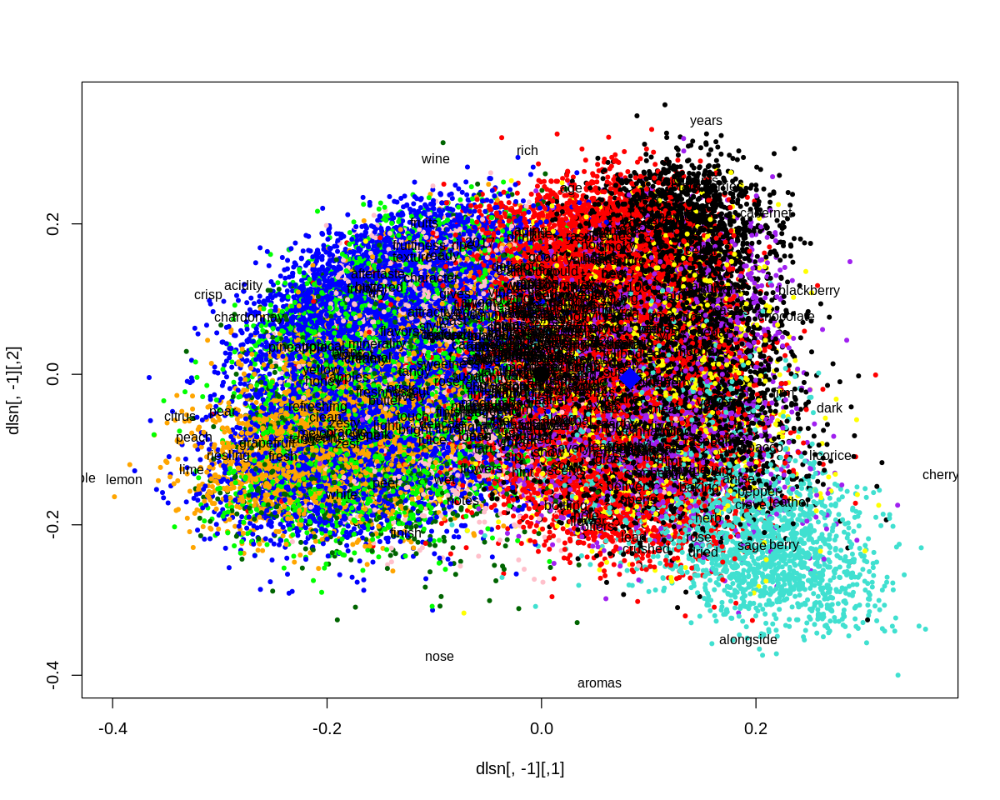

In [221]:
plot( dlsn[,-1], pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto[,-1], labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(PinotNoirQuery$ls)[2],normrows(PinotNoirQuery$ls)[3],cex=3,pch=18,col="blue")

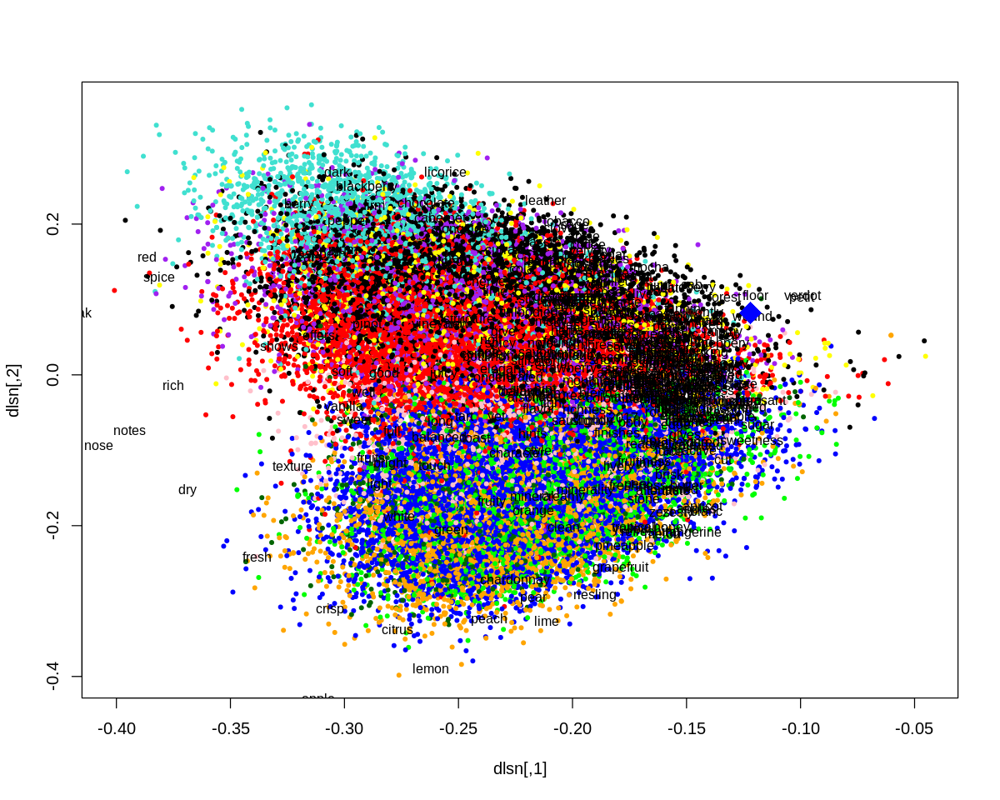

In [222]:
plot( dlsn, pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto, labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(PinotNoirQuery$ls),cex=3,pch=18,col="blue")

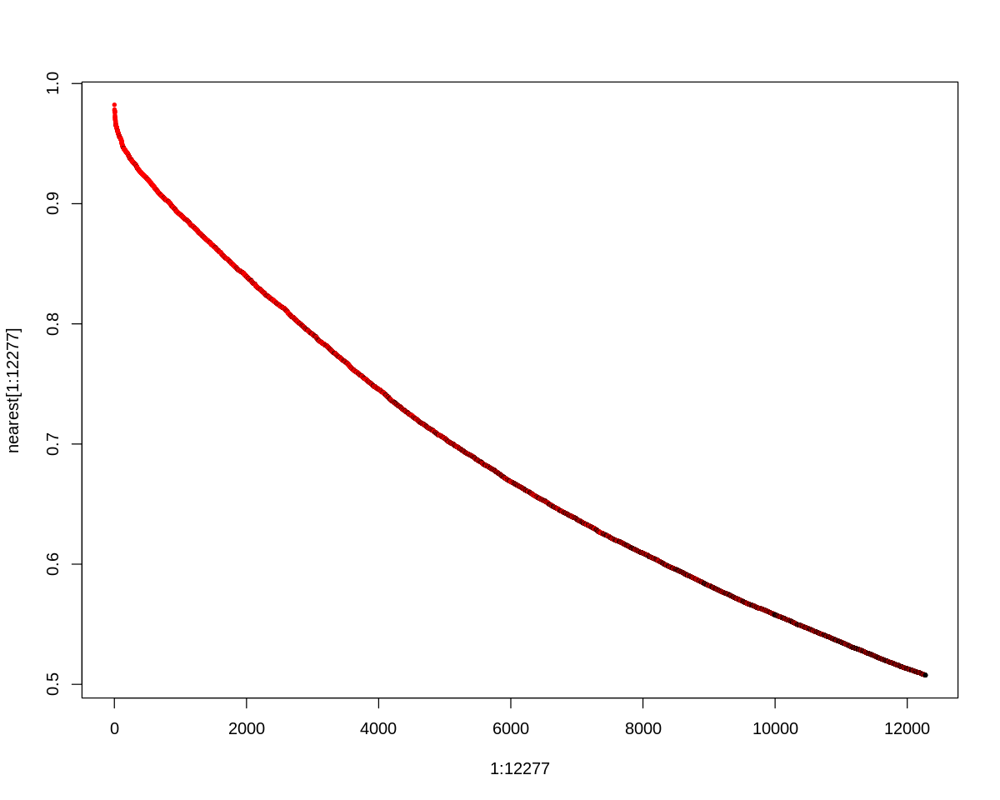

In [223]:
nearest <- sort( cosines( dls[,1:6], PinotNoirQuery$ls[1:6] ), decreasing=T )

damcols2 <- rep( "black", length(variety) )
damcols2[ variety == "Pinot Noir" ] <- "red" 

plot( 1:12277, nearest[1:12277], pch=20, cex=0.7, col=damcols2[strtoi(names(nearest))] )

In [224]:
table(variety[top(cosines(dls[,1:6],PinotNoirQuery$ls[1:6]),12277)])["Pinot Noir"]/12277

Pinot Noir 
  0.615134

In [225]:
PinotNoirQuery.vs.PinotNoir <- table(1:nrow(dls) %in% top(cosines(dls[,1:6], PinotNoirQuery$ls[1:6]), 12277), variety=="Pinot Noir" )
dimnames(PinotNoirQuery.vs.PinotNoir) <- list(PinotNoirQuery = c("No", "Si"), PinotNoir = c("No", "Si"))
PinotNoirQuery.vs.PinotNoir

c = chisq.test( PinotNoirQuery.vs.PinotNoir, correct=FALSE )
c$expected
c$p.value

              PinotNoir
PinotNoirQuery    No    Si
            No 39630  4725
            Si  4725  7552

,No,Si
No,34739.476,9615.524
Si,9615.524,2661.476


[1] 0

In [226]:
head(sort(table(variety), decreasing = T),15)

variety
        Pinot Noir         Chardonnay Cabernet Sauvignon           Riesling 
             12277              10867               8837               4773 
             Syrah    Sauvignon Blanc               Rosé             Merlot 
              4616               4574               3220               2895 
          Nebbiolo    Sparkling Blend 
              2602               1971 

In [227]:
tropical.vs.Chardonnay <- table( tdm["tropical",]>0, variety=="Chardonnay")
dimnames(tropical.vs.Chardonnay) <- list(tropical = c("No", "Si"), Chardonnay = c("No", "Si"))
chisqtest = chisq.test( tropical.vs.Chardonnay, correct=FALSE )
chisqtest
chisqtest$expected
chisqtest$observed


	Pearson's Chi-squared test

data:  tropical.vs.Chardonnay
X-squared = 2167.7, df = 1, p-value < 2.2e-16


,No,Si
No,44209.384,10497.6156
Si,1555.616,369.3844


        Chardonnay
tropical    No    Si
      No 45000  9707
      Si   765  1160

In [235]:
ChardonnayQuery <- makequery( "tropical", tdm, lsar )
variety[top(cosines(dls[,1:6],ChardonnayQuery$ls[1:6]),20)]
#reviews[top(cosines(dls[,1:6],ChardonnayQuery$ls[1:6]),20)]
table( variety[ top( cosines( dls[,1:6], ChardonnayQuery$ls[1:6] ), 10867 ) ] )["Chardonnay"]

[1] "Chardonnay"      "Chardonnay"      "Chardonnay"      "Chardonnay"     
 [5] "Chardonnay"      "Chardonnay"      "Chardonnay"      "Chardonnay"     
 [9] "Chardonnay"      "Chardonnay"      "Chardonnay"      "Chardonnay"     
[13] "Chardonnay"      "Sauvignon Blanc" "Chardonnay"      "Chardonnay"     
[17] "Chardonnay"      "Chardonnay"      "Chardonnay"      "Chardonnay"

Chardonnay 
      6837

In [236]:
sort(cosines( tksrs[,1:6], ChardonnayQuery$dksrs[1:6] ), decreasing = T)[1:10]

tropical    pineapple        mango        chard         lees    fermented 
   0.9666464    0.9647356    0.9507672    0.9476953    0.9456190    0.9389190 
butterscotch    stainless       creamy       butter 
   0.9364848    0.9294148    0.9287891    0.9234403

In [237]:
sort(tnorms4[cosines(tksrs[,1:6],ChardonnayQuery$dksrs[1:6])>0.9],decreasing = T)

pineapple     tropical       creamy        mango       butter butterscotch 
   3.8542665    3.0779855    3.0554037    1.4579713    1.4517555    1.1890858 
       chard      buttery        pears    fermented         lees    stainless 
   1.0667374    1.0333714    0.9760173    0.9275344    0.8327393    0.6850692

In [242]:
ChardonnayQuery <- makequery( "tropical creamy", tdm, lsar )
variety[top(cosines(dls[,1:6],ChardonnayQuery$ls[1:6]),20)]
#reviews[top(cosines(dls[,1:6],ChardonnayQuery$ls[1:6]),20)]
table( variety[ top( cosines( dls[,1:6], ChardonnayQuery$ls[1:6] ), 10867 ) ] )["Chardonnay"]

[1] "Chardonnay"      "Chardonnay"      "Chardonnay"      "Chardonnay"     
 [5] "Chardonnay"      "Chardonnay"      "Chardonnay"      "Chardonnay"     
 [9] "Chardonnay"      "Chardonnay"      "Sauvignon Blanc" "Chardonnay"     
[13] "Chardonnay"      "Chardonnay"      "Chardonnay"      "Chardonnay"     
[17] "Chardonnay"      "Chardonnay"      "Chardonnay"      "Chardonnay"

Chardonnay 
      6860

In [243]:
sort(cosines( tksrs[,1:6], ChardonnayQuery$dksrs[1:6] ), decreasing = T)[1:10]

tropical    pineapple        mango         lees        chard butterscotch 
   0.9692507    0.9690629    0.9568190    0.9501886    0.9490825    0.9429014 
   fermented       creamy    stainless       butter 
   0.9419676    0.9407035    0.9293993    0.9287770

In [245]:
sort(tnorms4[cosines(tksrs[,1:6],ChardonnayQuery$dksrs[1:6])>0.9],decreasing = T)

chardonnay    pineapple     tropical       creamy        honey        mango 
   5.5449249    3.8542665    3.0779855    3.0554037    2.7022234    1.4579713 
      butter        cream butterscotch        chard       golden      buttery 
   1.4517555    1.3247783    1.1890858    1.0667374    1.0510662    1.0333714 
       pears    fermented         lees        steel    stainless 
   0.9760173    0.9275344    0.8327393    0.7441718    0.6850692

In [268]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:6],ChardonnayQuery$dksrs[1:6])>0.6],decreasing = T))) {
  ChardonnayQuery <- makequery( paste("tropical creamy ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:6], ChardonnayQuery$ls[1:6] ), 10867 ) ] )["Chardonnay"]
  if(n>6860) {
    print(paste(newWord,":", n ))
  }
}

[1] "creamy : 6864"
[1] "minerality : 6927"
[1] "richness : 7021"
[1] "apricot : 6894"
[1] "months : 6904"
[1] "opulent : 7009"
[1] "adds : 6865"
[1] "apricots : 6929"
[1] "dominate : 6899"


In [307]:
ChardonnayQuery <- makequery( "creamy richness apricots minerality", tdm, lsar )
variety[top(cosines(dls[,1:6],ChardonnayQuery$ls[1:6]),20)]
#reviews[top(cosines(dls[,1:6],ChardonnayQuery$ls[1:6]),20)]
head(sort(table( variety[ top( cosines( dls[,1:6], ChardonnayQuery$ls[1:6] ), 10867 ) ] ),decreasing = T))

[1] "Chardonnay"      "Chardonnay"      "Chardonnay"      "Sauvignon Blanc"
 [5] "Chardonnay"      "Chardonnay"      "Chardonnay"      "Chardonnay"     
 [9] "Chardonnay"      "Chardonnay"      "Chardonnay"      "Chardonnay"     
[13] "Chardonnay"      "Chardonnay"      "Chardonnay"      "Chardonnay"     
[17] "Chardonnay"      "Chardonnay"      "Chardonnay"      "Chardonnay"


     Chardonnay        Riesling Sauvignon Blanc Sparkling Blend      Pinot Noir 
           7237            1505            1365             367             174 
           Rosé 
             90 

In [286]:
sort(cosines( tksrs[,1:6], ChardonnayQuery$dksrs[1:6] ), decreasing = T)[1:10]

apricots   apricot  tropical    creamy     pears      lees   peaches     mango 
0.9600306 0.9384963 0.9165983 0.9164612 0.9106837 0.9001095 0.8950396 0.8758293 
 richness   caramel 
0.8735565 0.8674736

In [310]:
sort(tnorms4[cosines(tksrs[,1:6],ChardonnayQuery$dksrs[1:6])>0.7],decreasing = T)

ripe   chardonnay        toast        peach         pear    pineapple 
   6.0823592    5.5449249    4.7076255    4.6591311    4.2710753    3.8542665 
    buttered     tropical       creamy       yellow        honey   minerality 
   3.5872871    3.0779855    3.0554037    2.8499068    2.7022234    2.4404791 
    richness      apricot      caramel         aged       apples        mango 
   2.3215115    2.2129647    1.6977699    1.6665424    1.6038811    1.4579713 
      butter        cream       months butterscotch      opulent   pineapples 
   1.4517555    1.3247783    1.2594049    1.1890858    1.1437135    1.1053238 
        adds      honeyed        meyer        chard       golden      buttery 
   1.1027080    1.0971786    1.0685797    1.0667374    1.0510662    1.0333714 
       pears      peaches    fermented      barrels         lees        limes 
   0.9760173    0.9672810    0.9275344    0.9204965    0.8327393    0.8303270 
  brightened        steel       papaya    stainless     apricots   underlying 
   0.8094677    0.7441718    0.7172693    0.6850692    0.6330444    0.6292723 
    dominate 
   0.6162639

In [308]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:6],ChardonnayQuery$dksrs[1:6])>0.6],decreasing = T))) {
  ChardonnayQuery <- makequery( paste("creamy richness apricots minerality ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:6], ChardonnayQuery$ls[1:6] ), 10867 ) ] )["Chardonnay"]
  if(n>7237) {
    print(paste(newWord,":", n ))
  }
}

[1] "minerality : 7240"
[1] "apricots : 7244"


In [312]:
ChardonnayQuery <- makequery( "creamy richness apricots minerality", tdm, lsar )
variety[top(cosines(dls[,1:6],ChardonnayQuery$ls[1:6]),20)]
#reviews[top(cosines(dls[,1:6],ChardonnayQuery$ls[1:6]),20)]
head(sort(table( variety[ top( cosines( dls[,1:6], ChardonnayQuery$ls[1:6] ), 10867 ) ] ),decreasing = T))

[1] "Chardonnay"      "Chardonnay"      "Chardonnay"      "Sauvignon Blanc"
 [5] "Chardonnay"      "Chardonnay"      "Chardonnay"      "Chardonnay"     
 [9] "Chardonnay"      "Chardonnay"      "Chardonnay"      "Chardonnay"     
[13] "Chardonnay"      "Chardonnay"      "Chardonnay"      "Chardonnay"     
[17] "Chardonnay"      "Chardonnay"      "Chardonnay"      "Chardonnay"


     Chardonnay        Riesling Sauvignon Blanc Sparkling Blend      Pinot Noir 
           7237            1505            1365             367             174 
           Rosé 
             90 

In [313]:
table(variety)["Chardonnay"]/length(variety)

Chardonnay 
  0.191888

In [314]:
table( variety[ top( cosines( dls[,1:6], ChardonnayQuery$ls[1:6] ), 10867 ) ] )["Chardonnay"]/table(variety)["Chardonnay"]

Chardonnay 
 0.6659612

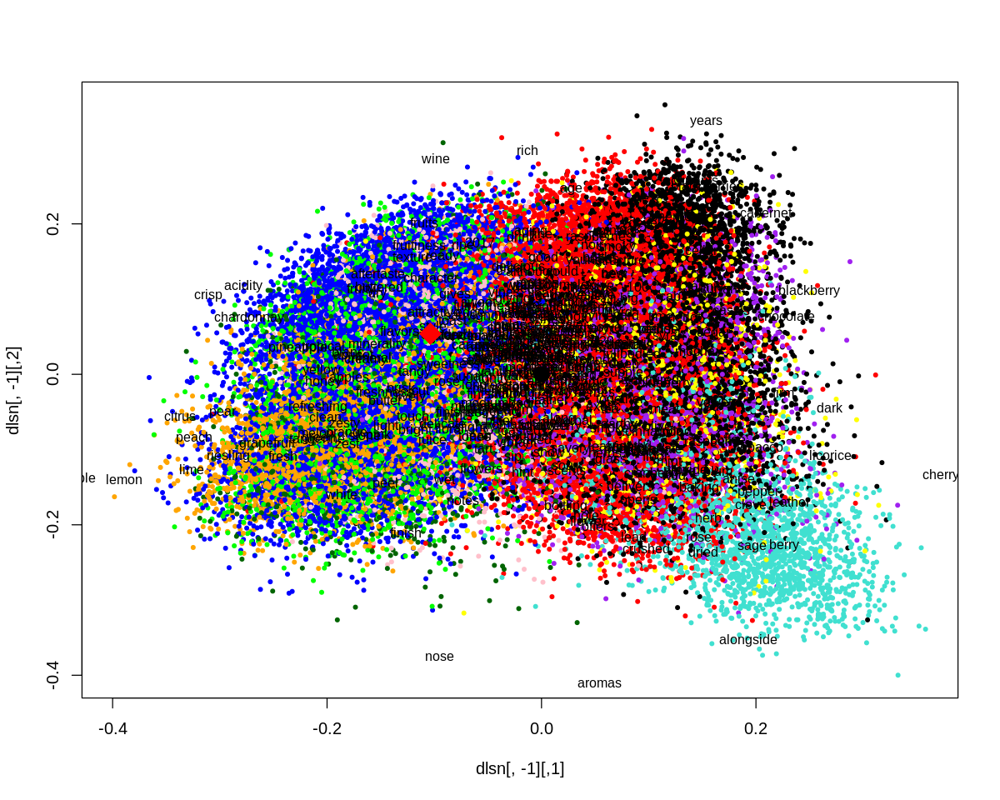

In [315]:
plot( dlsn[,-1], pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto[,-1], labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(ChardonnayQuery$ls)[2],normrows(ChardonnayQuery$ls)[3],cex=3,pch=18,col="red")

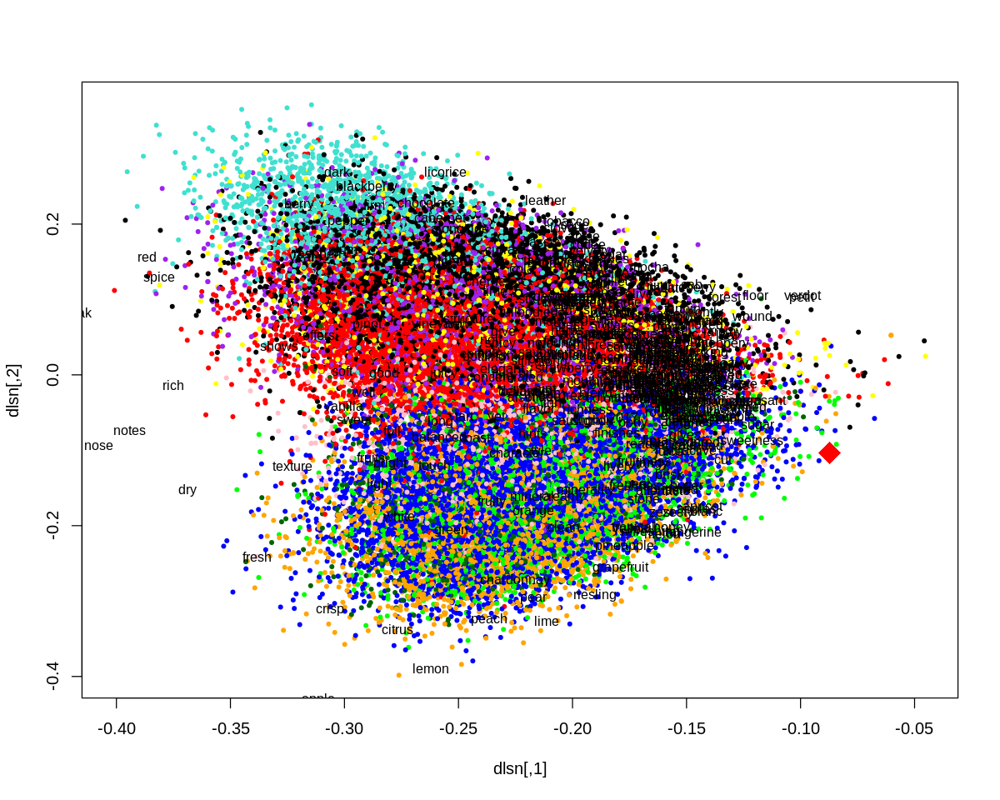

In [316]:
plot( dlsn, pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto, labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(ChardonnayQuery$ls),cex=3,pch=18,col="red")

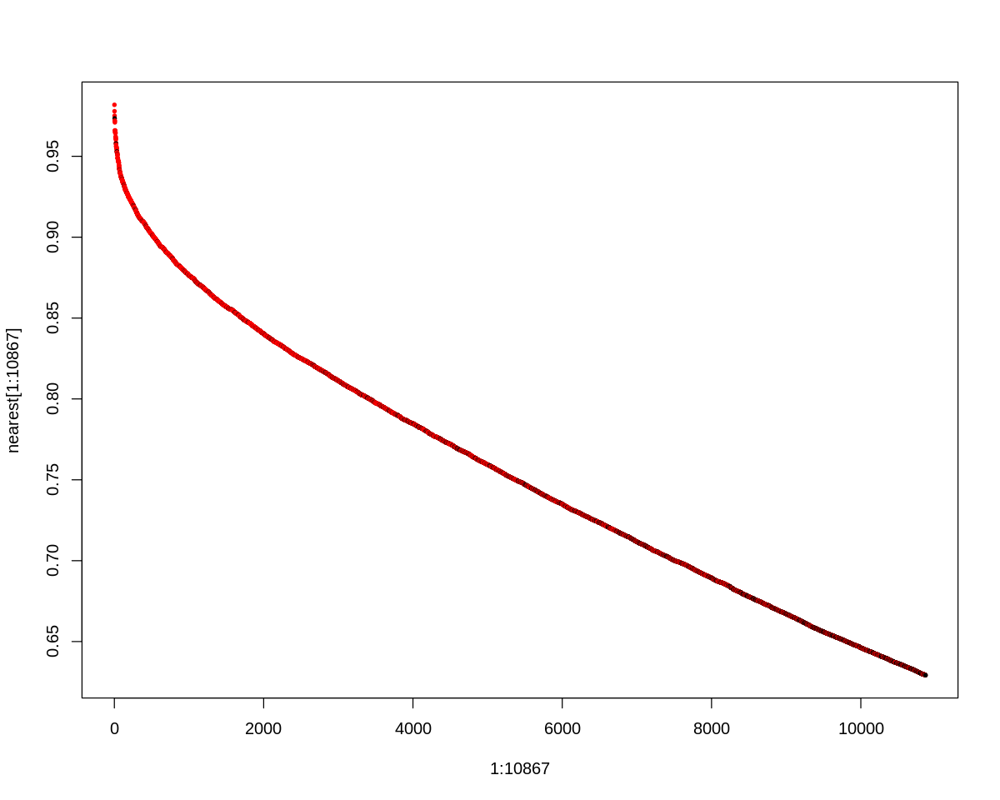

In [317]:
nearest <- sort( cosines( dls[,1:6], ChardonnayQuery$ls[1:6] ), decreasing=T )

damcols2 <- rep( "black", length(variety) )
damcols2[ variety == "Chardonnay" ] <- "red" 

plot( 1:10867, nearest[1:10867], pch=20, cex=0.7, col=damcols2[strtoi(names(nearest))] )

In [318]:
ChardonnayQuery.vs.Chardonnay <- table(1:nrow(dls) %in% top(cosines(dls[,1:6], ChardonnayQuery$ls[1:6]), 10867), variety=="Chardonnay" )
dimnames(ChardonnayQuery.vs.Chardonnay) <- list(ChardonnayQuery = c("No", "Si"), Chardonnay = c("No", "Si"))
ChardonnayQuery.vs.Chardonnay

c = chisq.test( ChardonnayQuery.vs.Chardonnay, correct=FALSE )
c$expected
c$p.value

               Chardonnay
ChardonnayQuery    No    Si
             No 42135  3630
             Si  3630  7237

,No,Si
No,36983.247,8781.753
Si,8781.753,2085.247


[1] 0

In [319]:
blackberry.vs.CabernetSauvignon <- table( tdm["blackberry",]>0, variety=="Cabernet Sauvignon")
dimnames(blackberry.vs.CabernetSauvignon) <- list(blackberry = c("No", "Si"), CabernetSauvignon = c("No", "Si"))
chisqtest = chisq.test( blackberry.vs.CabernetSauvignon, correct=FALSE )
chisqtest
chisqtest$expected
chisqtest$observed


	Pearson's Chi-squared test

data:  blackberry.vs.CabernetSauvignon
X-squared = 4847.4, df = 1, p-value < 2.2e-16


,No,Si
No,44387.944,8207.0563
Si,3407.056,629.9437


          CabernetSauvignon
blackberry    No    Si
        No 45935  6660
        Si  1860  2177

In [320]:
currants.vs.CabernetSauvignon <- table( tdm["currant",]>0, variety=="Cabernet Sauvignon")
dimnames(currants.vs.CabernetSauvignon) <- list(currants = c("No", "Si"), CabernetSauvignon = c("No", "Si"))
chisqtest = chisq.test( currants.vs.CabernetSauvignon, correct=FALSE )
chisqtest
chisqtest$expected
chisqtest$observed


	Pearson's Chi-squared test

data:  currants.vs.CabernetSauvignon
X-squared = 2728.8, df = 1, p-value < 2.2e-16


,No,Si
No,45762.75,8461.2496
Si,2032.25,375.7504


        CabernetSauvignon
currants    No    Si
      No 46673  7551
      Si  1122  1286

In [321]:
currant.blackberry.vs.CabernetSauvignon <- table( tdm["currant",]>0 & tdm["blackberry",]>0, variety=="Cabernet Sauvignon")
dimnames(currant.blackberry.vs.CabernetSauvignon) <- list(currant.blackberry = c("No", "Si"), CabernetSauvignon = c("No", "Si"))
chisqtest = chisq.test( currant.blackberry.vs.CabernetSauvignon, correct=FALSE )
chisqtest
chisqtest$expected
chisqtest$observed


	Pearson's Chi-squared test

data:  currant.blackberry.vs.CabernetSauvignon
X-squared = 2039.1, df = 1, p-value < 2.2e-16


,No,Si
No,47224.4847,8731.5153
Si,570.5153,105.4847


                  CabernetSauvignon
currant.blackberry    No    Si
                No 47648  8308
                Si   147   529

In [325]:
CabernetSauvignonQuery <- makequery( "currant blackberry", tdm, lsar )
variety[top(cosines(dls[,1:6],CabernetSauvignonQuery$ls[1:6]),20)]
#reviews[top(cosines(dls[,1:6],CabernetSauvignonQuery$ls[1:6]),30)]
table( variety[ top( cosines( dls[,1:6], CabernetSauvignonQuery$ls[1:6] ), 8837 ) ] )["Cabernet Sauvignon"]

[1] "Merlot"             "Cabernet Sauvignon" "Cabernet Sauvignon"
 [4] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
 [7] "Syrah"              "Cabernet Sauvignon" "Cabernet Sauvignon"
[10] "Merlot"             "Cabernet Sauvignon" "Cabernet Sauvignon"
[13] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[16] "Cabernet Sauvignon" "Cabernet Sauvignon" "Merlot"            
[19] "Cabernet Sauvignon" "Cabernet Sauvignon"

Cabernet Sauvignon 
              5142

In [326]:
sort(cosines( tksrs[,1:6], CabernetSauvignonQuery$dksrs[1:6] ), decreasing = T)[1:10]

verdot      franc      petit     malbec   cabernet     merlot blackberry 
 0.9840565  0.9839196  0.9817357  0.9795955  0.9637508  0.9604698  0.9589367 
    cassis    blended        cab 
 0.9469303  0.9437999  0.9437439

In [328]:
sort(tnorms4[cosines(tksrs[,1:6],CabernetSauvignonQuery$dksrs[1:6])>0.9],decreasing = T)

cabernet blackberry  chocolate     cassis     tannic      syrah     merlot 
 5.4379538  5.3324780  4.3761543  3.5712887  3.2317246  2.5459160  2.4968758 
     cedar        cab     verdot      petit      franc     malbec    blended 
 2.4750647  1.9472627  1.3220953  1.2953528  1.1569946  0.8540558  0.8223071

In [337]:
CabernetSauvignonQuery <- makequery( "currant blackberry chocolate", tdm, lsar )
variety[top(cosines(dls[,1:6],CabernetSauvignonQuery$ls[1:6]),20)]
#reviews[top(cosines(dls[,1:6],CabernetSauvignonQuery$ls[1:6]),30)]
table( variety[ top( cosines( dls[,1:6], CabernetSauvignonQuery$ls[1:6] ), 8837 ) ] )["Cabernet Sauvignon"]

[1] "Merlot"             "Cabernet Sauvignon" "Cabernet Sauvignon"
 [4] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
 [7] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[10] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[13] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[16] "Cabernet Sauvignon" "Syrah"              "Cabernet Sauvignon"
[19] "Syrah"              "Cabernet Sauvignon"

Cabernet Sauvignon 
              5163

In [338]:
sort(cosines( tksrs[,1:6], CabernetSauvignonQuery$dksrs[1:6] ), decreasing = T)[1:10]

verdot      petit     malbec      franc blackberry   cabernet     cassis 
 0.9907541  0.9880036  0.9790412  0.9755136  0.9719375  0.9668061  0.9650712 
    merlot    blended        cab 
 0.9556259  0.9489375  0.9487972

In [340]:
sort(tnorms4[cosines(tksrs[,1:6],CabernetSauvignonQuery$dksrs[1:6])>0.9],decreasing = T)

cabernet blackberry  chocolate     cassis     tannic     merlot      cedar 
 5.4379538  5.3324780  4.3761543  3.5712887  3.2317246  2.4968758  2.4750647 
       cab  blueberry     verdot      petit      franc     malbec    blended 
 1.9472627  1.7966514  1.3220953  1.2953528  1.1569946  0.8540558  0.8223071

In [356]:
CabernetSauvignonQuery <- makequery( "blackberry", tdm, lsar )
variety[top(cosines(dls[,1:6],CabernetSauvignonQuery$ls[1:6]),20)]
#reviews[top(cosines(dls[,1:6],CabernetSauvignonQuery$ls[1:6]),30)]
table( variety[ top( cosines( dls[,1:6], CabernetSauvignonQuery$ls[1:6] ), 8837 ) ] )["Cabernet Sauvignon"]

[1] "Cabernet Sauvignon" "Merlot"             "Cabernet Sauvignon"
 [4] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
 [7] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[10] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[13] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[16] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[19] "Cabernet Sauvignon" "Syrah"

Cabernet Sauvignon 
              5220

In [357]:
sort(cosines( tksrs[,1:6], CabernetSauvignonQuery$dksrs[1:6] ), decreasing = T)[1:10]

verdot      petit     malbec     cassis blackberry      franc   cabernet 
 0.9896418  0.9867679  0.9704390  0.9645680  0.9626760  0.9601735  0.9543729 
   blended  chocolate        cab 
 0.9389292  0.9368421  0.9307881

In [358]:
sort(tnorms4[cosines(tksrs[,1:6],CabernetSauvignonQuery$dksrs[1:6])>0.75],decreasing = T)

cabernet  blackberry   chocolate      cassis     currant      tannic 
  5.4379538   5.3324780   4.3761543   3.5712887   3.2568406   3.2317246 
  sauvignon       syrah      merlot       cedar         100         cab 
  2.7976345   2.5459160   2.4968758   2.4750647   2.1063188   1.9472627 
  blueberry       olive        deep        napa        hard    varietal 
  1.7966514   1.6621041   1.6511461   1.5868621   1.5688216   1.3895592 
     verdot       thick       petit    mountain       franc         tar 
  1.3220953   1.3182353   1.2953528   1.1921303   1.1569946   1.0610688 
     malbec     blended       meaty     charred        milk    leathery 
  0.8540558   0.8223071   0.7908156   0.7722997   0.7536655   0.7307967 
       heat      shiraz astringency 
  0.6589253   0.6345433   0.5757967

In [379]:
CabernetSauvignonQuery <- makequery( "blackberry mountain", tdm, lsar )
variety[top(cosines(dls[,1:6],CabernetSauvignonQuery$ls[1:6]),20)]
#reviews[top(cosines(dls[,1:6],CabernetSauvignonQuery$ls[1:6]),30)]
head(sort(table( variety[ top( cosines( dls[,1:6], CabernetSauvignonQuery$ls[1:6] ), 8837 ) ] ), decreasing = T))

[1] "Merlot"             "Cabernet Sauvignon" "Cabernet Sauvignon"
 [4] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
 [7] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[10] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[13] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[16] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[19] "Syrah"              "Cabernet Sauvignon"


Cabernet Sauvignon              Syrah             Merlot         Pinot Noir 
              5248               1716               1050                700 
          Nebbiolo               Rosé 
                52                 35 

In [370]:
sort(cosines( tksrs[,1:6], CabernetSauvignonQuery$dksrs[1:6] ), decreasing = T)[1:10]

verdot      petit     cassis   cabernet blackberry     malbec      franc 
 0.9896984  0.9870466  0.9717802  0.9711756  0.9665415  0.9653162  0.9611342 
       cab    blended  chocolate 
 0.9477132  0.9469207  0.9420178

In [371]:
sort(tnorms4[cosines(tksrs[,1:6],CabernetSauvignonQuery$dksrs[1:6])>0.75],decreasing = T)

cabernet  blackberry   chocolate      cassis     currant      tannic 
  5.4379538   5.3324780   4.3761543   3.5712887   3.2568406   3.2317246 
      syrah      merlot       cedar         100         cab   blueberry 
  2.5459160   2.4968758   2.4750647   2.1063188   1.9472627   1.7966514 
      olive        deep        napa        hard    varietal      verdot 
  1.6621041   1.6511461   1.5868621   1.5688216   1.3895592   1.3220953 
      thick      tannin       petit    mountain       franc      malbec 
  1.3182353   1.3173841   1.2953528   1.1921303   1.1569946   0.8540558 
    blended       meaty     charred        milk       tough    leathery 
  0.8223071   0.7908156   0.7722997   0.7536655   0.7360930   0.7307967 
       heat      shiraz astringency 
  0.6589253   0.6345433   0.5757967

In [380]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:6],CabernetSauvignonQuery$dksrs[1:6])>0.6],decreasing = T))) {
  CabernetSauvignonQuery <- makequery( paste("blackberry mountain", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:6], CabernetSauvignonQuery$ls[1:6] ), 8837 ) ] )["Cabernet Sauvignon"]
  if(n>5250) {
    print(paste(newWord,":", n ))
  }
}

[1] "cab : 5256"
[1] "mountain : 5254"
[1] "release : 5251"


In [383]:
CabernetSauvignonQuery <- makequery( "blackberry mountain cab", tdm, lsar )
variety[top(cosines(dls[,1:6],CabernetSauvignonQuery$ls[1:6]),20)]
#reviews[top(cosines(dls[,1:6],CabernetSauvignonQuery$ls[1:6]),30)]
head(sort(table( variety[ top( cosines( dls[,1:6], CabernetSauvignonQuery$ls[1:6] ), 8837 ) ] ), decreasing = T))

[1] "Cabernet Sauvignon" "Merlot"             "Cabernet Sauvignon"
 [4] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
 [7] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[10] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[13] "Cabernet Sauvignon" "Cabernet Sauvignon" "Cabernet Sauvignon"
[16] "Syrah"              "Cabernet Sauvignon" "Syrah"             
[19] "Cabernet Sauvignon" "Cabernet Sauvignon"


Cabernet Sauvignon              Syrah             Merlot         Pinot Noir 
              5247               1678               1057                724 
          Nebbiolo               Rosé 
                49                 38 

In [384]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:6],CabernetSauvignonQuery$dksrs[1:6])>0.5],decreasing = T))) {
  CabernetSauvignonQuery <- makequery( paste("blackberry mountain cab", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:6], CabernetSauvignonQuery$ls[1:6] ), 8837 ) ] )["Cabernet Sauvignon"]
  if(n>5255) {
    print(paste(newWord,":", n ))
  }
}

In [385]:
table(variety)["Cabernet Sauvignon"]/length(variety)

Cabernet Sauvignon 
         0.1560425

In [386]:
table( variety[ top( cosines( dls[,1:6], CabernetSauvignonQuery$ls[1:6] ), 8837 ) ] )["Cabernet Sauvignon"]/table(variety)["Cabernet Sauvignon"]

Cabernet Sauvignon 
         0.5925088

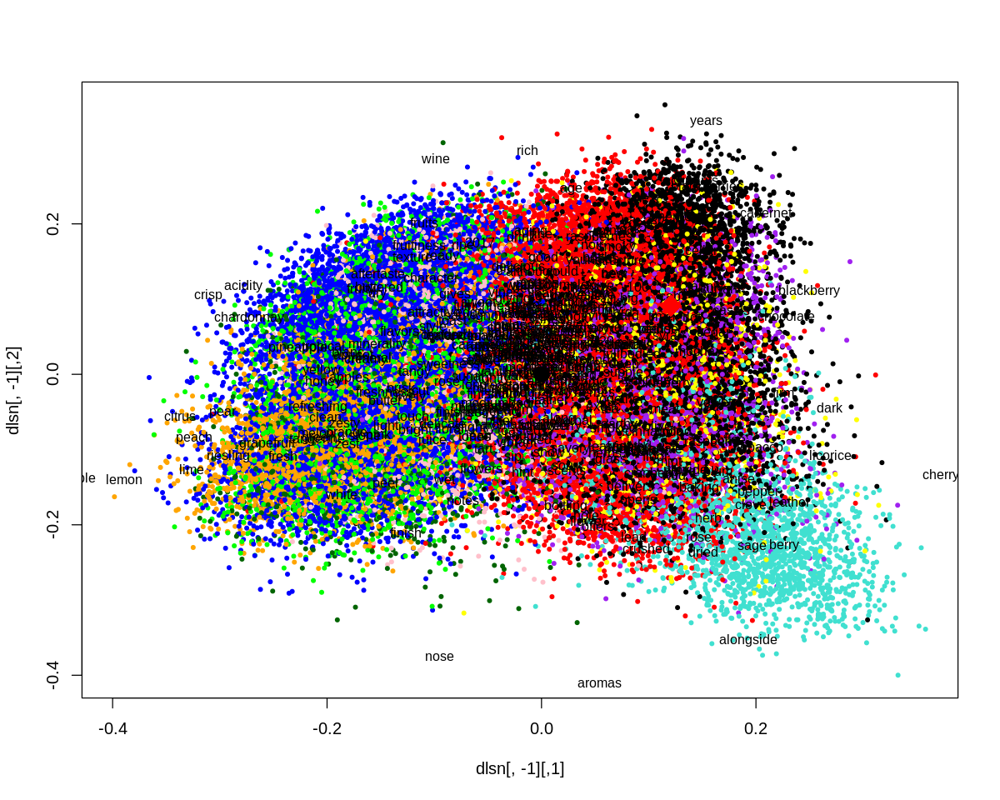

In [387]:
plot( dlsn[,-1], pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto[,-1], labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(CabernetSauvignonQuery$ls)[2],normrows(CabernetSauvignonQuery$ls)[3],cex=3,pch=18,col="red")

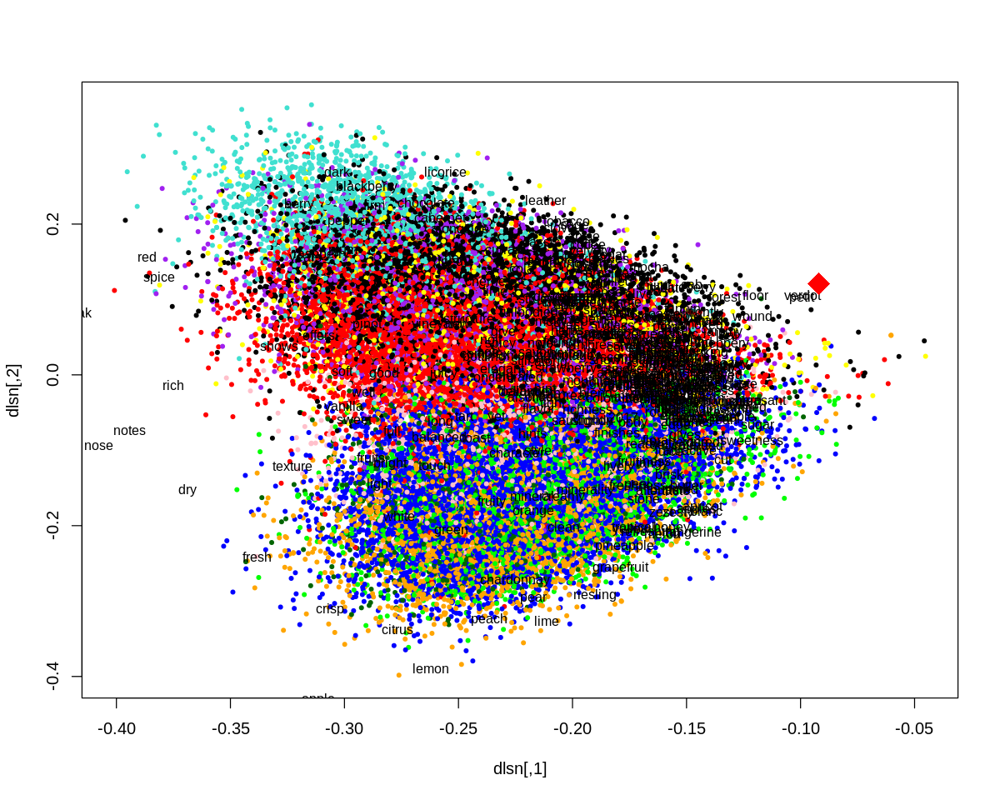

In [388]:
plot( dlsn, pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto, labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(CabernetSauvignonQuery$ls),cex=3,pch=18,col="red")

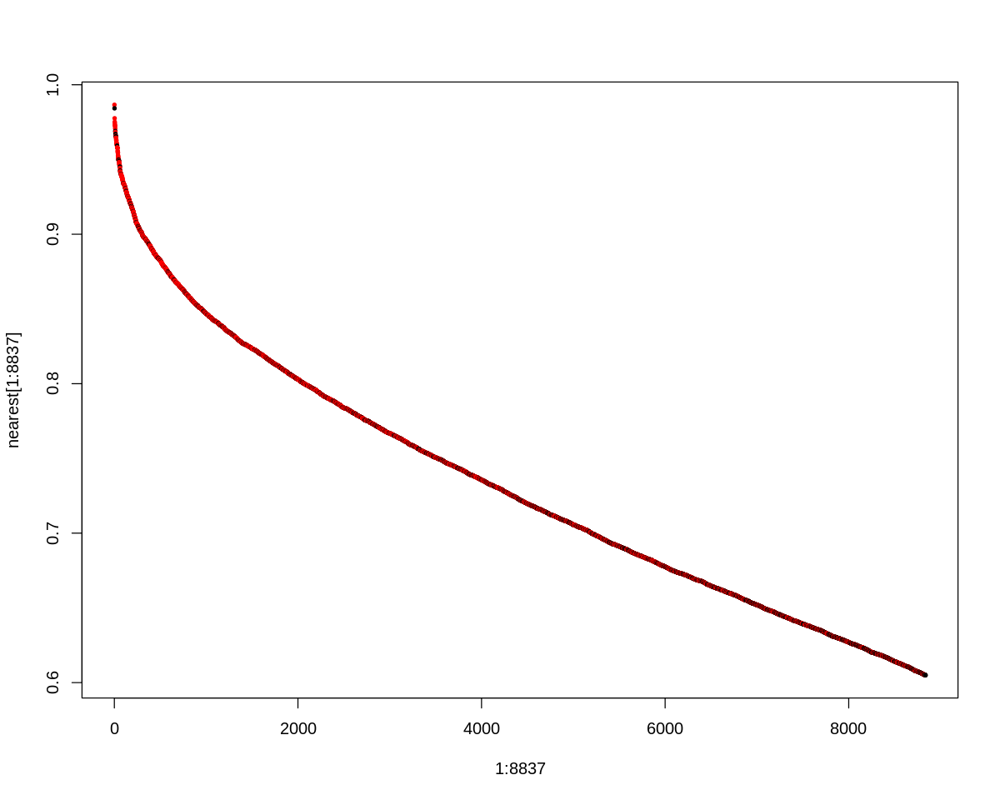

In [389]:
nearest <- sort( cosines( dls[,1:6], CabernetSauvignonQuery$ls[1:6] ), decreasing=T )

damcols2 <- rep( "black", length(variety) )
damcols2[ variety == "Cabernet Sauvignon" ] <- "red" 

plot( 1:8837, nearest[1:8837], pch=20, cex=0.7, col=damcols2[strtoi(names(nearest))] )

In [391]:
CabernetSauvignonQuery.vs.CabernetSauvignon <- table(1:nrow(dls) %in% top(cosines(dls[,1:6], CabernetSauvignonQuery$ls[1:6]), 8837), variety=="Cabernet Sauvignon" )
dimnames(CabernetSauvignonQuery.vs.CabernetSauvignon) <- list(CabernetSauvignonQuery = c("No", "Si"), CabernetSauvignon = c("No", "Si"))
CabernetSauvignonQuery.vs.CabernetSauvignon

c = chisq.test( CabernetSauvignonQuery.vs.CabernetSauvignon, correct=FALSE )
c$expected
c$p.value

                      CabernetSauvignon
CabernetSauvignonQuery    No    Si
                    No 44194  3601
                    Si  3601  5236

,No,Si
No,40336.948,7458.052
Si,7458.052,1378.948


[1] 0

In [392]:
lemon.vs.Riesling <- table( tdm["lemon",]>0, variety=="Riesling")
dimnames(lemon.vs.Riesling) <- list(lemon = c("No", "Si"), Riesling = c("No", "Si"))
chisqtest = chisq.test( lemon.vs.Riesling, correct=FALSE )
chisqtest
chisqtest$expected
chisqtest$observed


	Pearson's Chi-squared test

data:  lemon.vs.Riesling
X-squared = 2345.7, df = 1, p-value < 2.2e-16


,No,Si
No,48075.249,4424.751
Si,3783.751,348.249


     Riesling
lemon    No    Si
   No 48908  3592
   Si  2951  1181

In [406]:
RieslingQuery <- makequery( "lemon", tdm, lsar )
variety[top(cosines(dls[,1:6],RieslingQuery$ls[1:6]),20)]
#reviews[top(cosines(dls[,1:6],RieslingQuery$ls[1:6]),30)]
table( variety[ top( cosines( dls[,1:6], RieslingQuery$ls[1:6] ), 4773 ) ] )["Riesling"]

[1] "Riesling"        "Chardonnay"      "Riesling"        "Sauvignon Blanc"
 [5] "Sauvignon Blanc" "Chardonnay"      "Riesling"        "Chardonnay"     
 [9] "Riesling"        "Sauvignon Blanc" "Riesling"        "Riesling"       
[13] "Chardonnay"      "Chardonnay"      "Riesling"        "Riesling"       
[17] "Riesling"        "Riesling"        "Riesling"        "Riesling"

Riesling 
    1915

In [407]:
sort(cosines( tksrs[,1:6], RieslingQuery$dksrs[1:6] ), decreasing = T)[1:10]

lemon      lime tangerine lemonlime  riesling     apple nectarine     melon 
0.9803859 0.9707335 0.9697542 0.9687911 0.9646244 0.9613680 0.9540054 0.9414932 
  blossom     stone 
0.9384113 0.9376432

In [408]:
sort(tnorms4[cosines(tksrs[,1:6],RieslingQuery$dksrs[1:6])>0.9],decreasing = T)

apple       lemon       peach        lime    riesling       melon 
  6.7247171   5.5767976   4.6591311   4.3907645   3.3081036   2.7020841 
  tangerine       zesty       stone   nectarine     blossom        rind 
  2.2816943   2.1475963   2.0121307   1.5235048   1.3712076   1.1932666 
       pith      lemony honeysuckle   lemonlime         sea       flesh 
  1.1777470   1.0920000   1.0202661   0.9834113   0.8132549   0.7355588 
      stony 
  0.7203552

In [435]:
RieslingQuery <- makequery( "zesty", tdm, lsar )
variety[top(cosines(dls[,1:6],RieslingQuery$ls[1:6]),20)]
#reviews[top(cosines(dls[,1:6],RieslingQuery$ls[1:6]),30)]
head(sort(table( variety[ top( cosines( dls[,1:6], RieslingQuery$ls[1:6] ), 4773 ) ] ),decreasing = T))

[1] "Riesling"        "Sauvignon Blanc" "Chardonnay"      "Riesling"       
 [5] "Riesling"        "Riesling"        "Riesling"        "Riesling"       
 [9] "Chardonnay"      "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc"
[13] "Riesling"        "Riesling"        "Riesling"        "Sauvignon Blanc"
[17] "Riesling"        "Riesling"        "Riesling"        "Riesling"


       Riesling Sauvignon Blanc      Chardonnay Sparkling Blend            Rosé 
           2020            1151             965             370             208 
     Pinot Noir 
             50 

In [436]:
sort(cosines( tksrs[,1:6], RieslingQuery$dksrs[1:6] ), decreasing = T)[1:10]

grapefruit      zesty   riesling     lemony       rind       pith gooseberry 
 0.9799509  0.9697604  0.9484969  0.9332433  0.9307509  0.9251642  0.9224253 
     grass  lemonlime       lime 
 0.9220397  0.9219022  0.9175437

In [437]:
sort(tnorms4[cosines(tksrs[,1:6],RieslingQuery$dksrs[1:6])>0.9],decreasing = T)

lemon       lime   riesling grapefruit      clean refreshing      zesty 
 5.5767976  4.3907645  3.3081036  3.1707423  3.0718048  2.7870795  2.1475963 
      rind       pith     lemony      grass  lemonlime gooseberry      flesh 
 1.1932666  1.1777470  1.0920000  1.0854021  0.9834113  0.8212933  0.7355588 
    citric    perfume 
 0.6574659  0.5583897

In [438]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:6],RieslingQuery$dksrs[1:6])>0.5],decreasing = T))) {
  RieslingQuery <- makequery( paste("zesty ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:6], RieslingQuery$ls[1:6] ), 4773 ) ] )["Riesling"]
  if(n>2020) {
    print(paste(newWord,":", n ))
  }
}

[1] "citrus : 2068"
[1] "white : 2107"
[1] "riesling : 2026"
[1] "clean : 2026"
[1] "orange : 2097"
[1] "minerality : 2033"
[1] "zest : 2151"
[1] "brisk : 2074"
[1] "floral : 2045"
[1] "apples : 2094"
[1] "aromatic : 2054"
[1] "tones : 2024"
[1] "blossom : 2037"
[1] "sweetness : 2059"
[1] "almond : 2049"
[1] "lend : 2059"
[1] "mouthwatering : 2052"
[1] "intensely : 2118"
[1] "yeasty : 2047"
[1] "minerally : 2028"
[1] "sparkler : 2133"
[1] "asian : 2088"
[1] "mousse : 2135"
[1] "stony : 2040"
[1] "keeps : 2032"
[1] "tone : 2026"
[1] "crispness : 2042"
[1] "richer : 2101"
[1] "delicately : 2106"
[1] "persistent : 2049"
[1] "yeast : 2109"
[1] "perfume : 2069"
[1] "wonderfully : 2041"
[1] "deeply : 2030"
[1] "penetrating : 2045"
[1] "easydrinking : 2023"


In [482]:
RieslingQuery <- makequery( "zesty yeast aromatic sweetness", tdm, lsar )
variety[top(cosines(dls[,1:6],RieslingQuery$ls[1:6]),20)]
#reviews[top(cosines(dls[,1:6],RieslingQuery$ls[1:6]),30)]
head(sort(table( variety[ top( cosines( dls[,1:6], RieslingQuery$ls[1:6] ), 4773 ) ] ),decreasing = T))

[1] "Riesling"        "Riesling"        "Riesling"        "Riesling"       
 [5] "Riesling"        "Sauvignon Blanc" "Chardonnay"      "Riesling"       
 [9] "Riesling"        "Sauvignon Blanc" "Riesling"        "Riesling"       
[13] "Riesling"        "Riesling"        "Riesling"        "Riesling"       
[17] "Riesling"        "Riesling"        "Riesling"        "Riesling"


       Riesling      Chardonnay Sauvignon Blanc Sparkling Blend            Rosé 
           2259            1060             841             381             176 
     Pinot Noir 
             46 

In [470]:
sort(cosines( tksrs[,1:6], RieslingQuery$dksrs[1:6] ), decreasing = T)[1:10]

perfume      zesty   riesling       zest    blossom      clean     mousse 
 0.9808613  0.9727254  0.9663024  0.9647924  0.9399378  0.9397840  0.9389192 
delicately      lemon       lend 
 0.9355994  0.9353591  0.9315931

In [471]:
sort(tnorms4[cosines(tksrs[,1:6],RieslingQuery$dksrs[1:6])>0.95],decreasing = T)

riesling     zesty      zest   perfume 
3.3081036 2.1475963 2.0892767 0.5583897

In [483]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:6],RieslingQuery$dksrs[1:6])>0.5],decreasing = T))) {
  RieslingQuery <- makequery( paste("zesty yeast aromatic sweetness ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:6], RieslingQuery$ls[1:6] ), 4773 ) ] )["Riesling"]
  if(n>2259) {
    print(paste(newWord,":", n ))
  }
}

[1] "flavors : 2275"
[1] "yet : 2284"
[1] "subtle : 2287"
[1] "pure : 2266"
[1] "makes : 2270"
[1] "adds : 2267"
[1] "add : 2271"
[1] "intensely : 2282"
[1] "streak : 2260"
[1] "without : 2283"
[1] "would : 2284"
[1] "boasts : 2270"
[1] "pair : 2262"
[1] "keeps : 2272"
[1] "dominate : 2269"
[1] "richer : 2270"
[1] "wonderfully : 2263"
[1] "deeply : 2271"
[1] "penetrating : 2261"
[1] "surprisingly : 2262"
[1] "focus : 2260"
[1] "nuanced : 2267"
[1] "otherwise : 2270"


In [532]:
RieslingQuery <- makequery( "zesty yeast aromatic sweetness subtle pure penetrating", tdm, lsar )
variety[top(cosines(dls[,1:6],RieslingQuery$ls[1:6]),20)]
#reviews[top(cosines(dls[,1:6],RieslingQuery$ls[1:6]),30)]
table( variety[ top( cosines( dls[,1:6], RieslingQuery$ls[1:6] ), 4773 ) ] )["Riesling"]

[1] "Riesling"        "Sparkling Blend" "Riesling"        "Riesling"       
 [5] "Riesling"        "Riesling"        "Riesling"        "Riesling"       
 [9] "Riesling"        "Riesling"        "Riesling"        "Riesling"       
[13] "Riesling"        "Sauvignon Blanc" "Sparkling Blend" "Riesling"       
[17] "Rosé"            "Riesling"        "Riesling"        "Riesling"

Riesling 
    2327

In [509]:
sort(cosines( tksrs[,1:6], RieslingQuery$dksrs[1:6] ), decreasing = T)[1:20]

perfume         zesty         clean      riesling    delicately 
    0.9872810     0.9711282     0.9671288     0.9564284     0.9436892 
       mousse          zest mouthwatering         stony          lend 
    0.9432723     0.9422635     0.9376615     0.9306459     0.9287420 
  penetrating        lemony       blossom         lemon        floral 
    0.9283830     0.9280521     0.9274731     0.9272791     0.9262776 
    tangerine        orange          lime          skin         yeast 
    0.9256896     0.9210667     0.9180858     0.9176462     0.9171822

In [510]:
sort(tnorms4[cosines(tksrs[,1:6],RieslingQuery$dksrs[1:6])>0.8],decreasing = T)

apple         lemon         fresh        citrus         peach 
    6.7247171     5.5767976     5.5005532     5.0199598     4.6591311 
         lime         white         touch      riesling    grapefruit 
    4.3907645     4.2679990     3.3312812     3.3081036     3.1707423 
        clean        orange    refreshing         melon         hints 
    3.0718048     3.0492859     2.7870795     2.7020841     2.3852071 
    freshness     tangerine         zesty          zest         stone 
    2.3170521     2.2816943     2.1475963     2.0892767     2.0121307 
        brisk      delicate          peel        floral        apples 
    1.9927147     1.9670117     1.7967243     1.7320755     1.6038811 
         pink     nectarine         tones       blossom          lean 
    1.5542138     1.5235048     1.3855840     1.3712076     1.3062591 
          cut          rind          pith     sweetness         juice 
    1.2947048     1.1932666     1.1777470     1.1558279     1.1486863 
      citrusy        lemony         grass          lend   honeysuckle 
    1.1415381     1.0920000     1.0854021     1.0348784     1.0202661 
    finishing          racy     lemonlime          skin mouthwatering 
    1.0183155     0.9924617     0.9834113     0.9728846     0.9023119 
    intensely        yeasty    gooseberry           sea     minerally 
    0.8867897     0.8272467     0.8212933     0.8132549     0.7932976 
      lingers      sparkler         flesh        mousse         stony 
    0.7828074     0.7395753     0.7355588     0.7229238     0.7203552 
       slight          tang      residual         keeps          tone 
    0.7168466     0.6724376     0.6698504     0.6347113     0.6346080 
  lightbodied        whiffs    delicately         yeast        purity 
    0.6346061     0.6070627     0.5897666     0.5758850     0.5722604 
      freshly       perfume         riper   wonderfully   penetrating 
    0.5618183     0.5583897     0.5445165     0.5444831     0.5249218 
   moderately       tension      friendly  easydrinking 
    0.5241061     0.5215830     0.4682072     0.4255247

In [533]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:6],RieslingQuery$dksrs[1:6])>0.6],decreasing = T))) {
  RieslingQuery <- makequery( paste("zesty yeast aromatic sweetness subtle pure penetrating ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:6], RieslingQuery$ls[1:6] ), 4773 ) ] )["Riesling"]
  if(n>2327) {
    print(paste(newWord,":", n ))
  }
}

[1] "pair : 2329"
[1] "deeply : 2328"
[1] "ginger : 2332"
[1] "interest : 2333"
[1] "otherwise : 2329"
[1] "aromatics : 2332"


In [536]:
RieslingQuery <- makequery( "zesty yeast aromatic sweetness subtle pure penetrating aromatics", tdm, lsar )
variety[top(cosines(dls[,1:6],RieslingQuery$ls[1:6]),20)]
#reviews[top(cosines(dls[,1:6],RieslingQuery$ls[1:6]),30)]
table( variety[ top( cosines( dls[,1:6], RieslingQuery$ls[1:6] ), 4773 ) ] )["Riesling"]

[1] "Riesling"        "Riesling"        "Sparkling Blend" "Riesling"       
 [5] "Riesling"        "Chardonnay"      "Riesling"        "Riesling"       
 [9] "Riesling"        "Sparkling Blend" "Riesling"        "Riesling"       
[13] "Rosé"            "Chardonnay"      "Pinot Noir"      "Riesling"       
[17] "Chardonnay"      "Riesling"        "Sparkling Blend" "Riesling"

Riesling 
    2332

In [537]:
sort(cosines( tksrs[,1:6], RieslingQuery$dksrs[1:6] ), decreasing = T)[1:10]

perfume         clean         zesty      riesling mouthwatering 
    0.9829411     0.9797466     0.9691019     0.9576603     0.9566114 
  penetrating    delicately        lemony        floral       blossom 
    0.9441643     0.9419982     0.9381382     0.9318952     0.9311306

In [538]:
sort(tnorms4[cosines(tksrs[,1:6],RieslingQuery$dksrs[1:6])>0.93],decreasing = T)

riesling         clean     tangerine         zesty        floral 
    3.3081036     3.0718048     2.2816943     2.1475963     1.7320755 
      blossom        lemony mouthwatering        mousse    delicately 
    1.3712076     1.0920000     0.9023119     0.7229238     0.5897666 
      perfume   penetrating 
    0.5583897     0.5249218

In [539]:
table(variety)["Riesling"]/length(variety)

Riesling 
0.08428097

In [540]:
table( variety[ top( cosines( dls[,1:6], RieslingQuery$ls[1:6] ), 4773 ) ] )["Riesling"]/table(variety)["Riesling"]

Riesling 
0.4885816

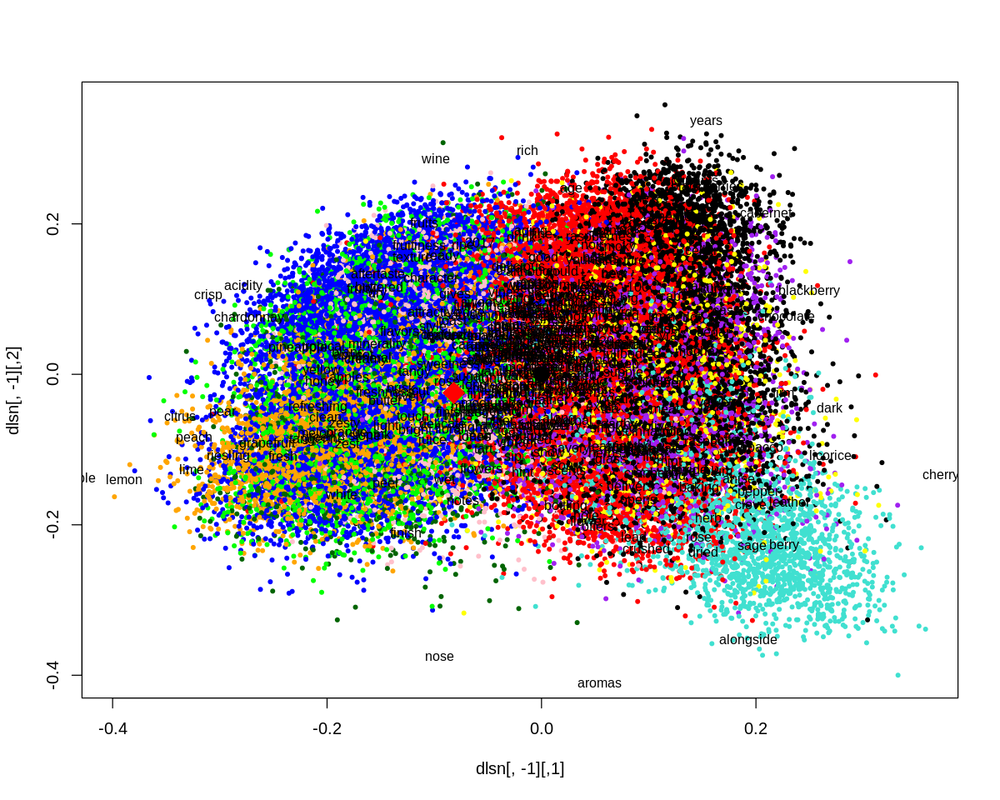

In [541]:
plot( dlsn[,-1], pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto[,-1], labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(RieslingQuery$ls)[2],normrows(RieslingQuery$ls)[3],cex=3,pch=18,col="red")

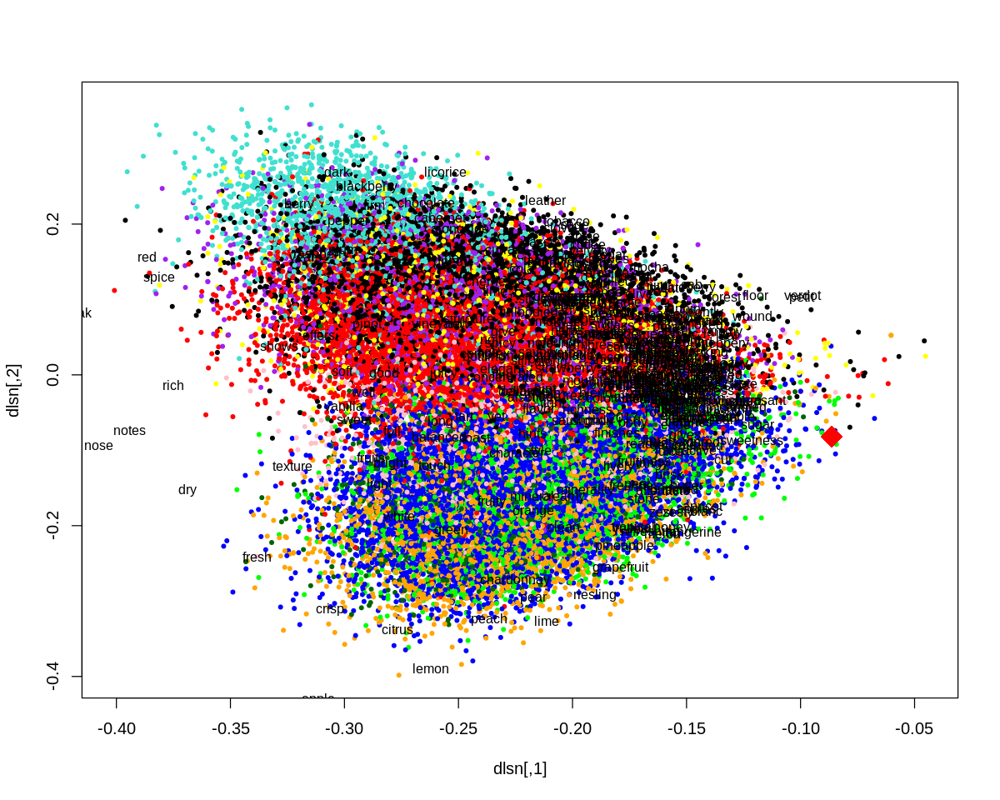

In [542]:
plot( dlsn, pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto, labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(RieslingQuery$ls),cex=3,pch=18,col="red")

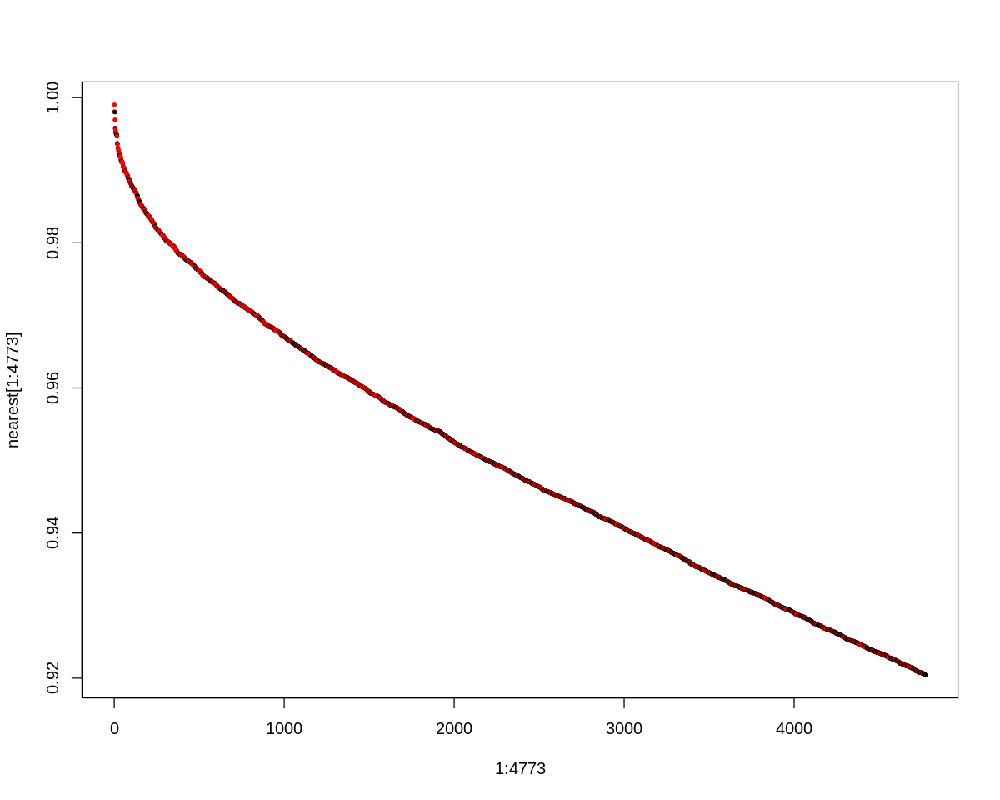

In [545]:
nearest <- sort( cosines( dls[,1:6], RieslingQuery$ls[1:6] ), decreasing=T )

damcols2 <- rep( "black", length(variety) )
damcols2[ variety == "Riesling" ] <- "red" 

plot( 1:4773, nearest[1:4773], pch=20, cex=0.7, col=damcols2[strtoi(names(nearest))] )

In [546]:
RieslingQuery.vs.Riesling <- table(1:nrow(dls) %in% top(cosines(dls[,1:6], RieslingQuery$ls[1:6]), 4773), variety=="Riesling" )
dimnames(RieslingQuery.vs.Riesling) <- list(RieslingQuery = c("No", "Si"), Riesling = c("No", "Si"))
RieslingQuery.vs.Riesling

c = chisq.test( RieslingQuery.vs.Riesling, correct=FALSE )
c$expected
c

             Riesling
RieslingQuery    No    Si
           No 49418  2441
           Si  2441  2332

,No,Si
No,47488.273,4370.7269
Si,4370.727,402.2731



	Pearson's Chi-squared test

data:  RieslingQuery.vs.Riesling
X-squared = 11039, df = 1, p-value < 2.2e-16


In [547]:
head(sort(rowSums(tdm[,variety=="Sauvignon Blanc"]),decreasing = T),20)

wine    flavors    acidity     finish      fruit     citrus      green 
      2892       2624       1489       1425       1355       1300       1266 
    aromas  sauvignon     palate      blanc      crisp      drink grapefruit 
      1221       1219       1142       1102       1036        941        886 
      lime       ripe      fresh      white      lemon      apple 
       853        799        783        751        741        708

In [559]:
green.vs.SauvignonBlanc <- table( tdm["green",]>0, variety=="Sauvignon Blanc")
dimnames(green.vs.SauvignonBlanc) <- list(green = c("No", "Si"), SauvignonBlanc = c("No", "Si"))
chisqtest = chisq.test( green.vs.SauvignonBlanc, correct=FALSE )
chisqtest
chisqtest$expected
chisqtest$observed


	Pearson's Chi-squared test

data:  green.vs.SauvignonBlanc
X-squared = 2152.8, df = 1, p-value < 2.2e-16


,No,Si
No,48396.695,4252.3048
Si,3661.305,321.6952


     SauvignonBlanc
green    No    Si
   No 49166  3483
   Si  2892  1091

In [560]:
SauvignonBlancQuery <- makequery( "green", tdm, lsar )
variety[top(cosines(dls[,1:6],SauvignonBlancQuery$ls[1:6]),20)]
#reviews[top(cosines(dls[,1:6],SauvignonBlancQuery$ls[1:6]),30)]
table( variety[ top( cosines( dls[,1:6], SauvignonBlancQuery$ls[1:6] ), 4574 ) ] )["Sauvignon Blanc"]

[1] "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc" "Sparkling Blend"
 [5] "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc"
 [9] "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc"
[13] "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc"
[17] "Sparkling Blend" "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc"

Sauvignon Blanc 
           1662

In [561]:
sort(cosines( tksrs[,1:6], SauvignonBlancQuery$dksrs[1:6] ), decreasing = T)[1:10]

grassy   passion     briny     green    citric     pithy     grass     salty 
0.9821322 0.9712566 0.9564031 0.9515612 0.9429357 0.9369175 0.9313131 0.9230246 
     mild   lasting 
0.9140349 0.9010535

In [562]:
sort(tnorms4[cosines(tksrs[,1:6],SauvignonBlancQuery$dksrs[1:6])>0.8],decreasing = T)

green grapefruit   slightly      blanc       feel        wet     bitter 
 4.2722873  3.1707423  2.4954193  2.0139041  1.6755708  1.4426618  1.2346213 
      pith      juice     lemony  midpalate      grass       mild      plump 
 1.1777470  1.1486863  1.0920000  1.0892132  1.0854021  1.0274374  0.9700558 
    chalky      briny      pithy     grassy       salt    passion gooseberry 
 0.9058413  0.9027435  0.8569551  0.8509401  0.8259785  0.8240464  0.8212933 
     short        sea      salty      flesh      skins     citric    lasting 
 0.8142360  0.8132549  0.8073078  0.7355588  0.7163264  0.6574659  0.6205289 
      flat bitterness      riper    generic moderately 
 0.6003431  0.5549308  0.5445165  0.5370825  0.5241061

In [604]:
SauvignonBlancQuery <- makequery( "green herbaceous", tdm, lsar )
variety[top(cosines(dls[,1:6],SauvignonBlancQuery$ls[1:6]),10)]
#reviews[top(cosines(dls[,1:6],SauvignonBlancQuery$ls[1:6]),30)]
table( variety[ top( cosines( dls[,1:6], SauvignonBlancQuery$ls[1:6] ), 4574 ) ] )["Sauvignon Blanc"]

[1] "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc" "Chardonnay"     
 [5] "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc"
 [9] "Sauvignon Blanc" "Sauvignon Blanc"

Sauvignon Blanc 
           1731

In [605]:
sort(cosines( tksrs[,1:6], SauvignonBlancQuery$dksrs[1:6] ), decreasing = T)[1:20]

grassy    passion      green     citric      grass gooseberry      briny 
 0.9779509  0.9478776  0.9353347  0.9289473  0.9165296  0.9152494  0.9098601 
     pithy      skins    lasting      salty bitterness     chalky grapefruit 
 0.9003643  0.8940670  0.8839284  0.8809895  0.8751806  0.8734411  0.8681594 
      mild      blanc      riper       pith     bitter     lemony 
 0.8610609  0.8426269  0.8365252  0.8295798  0.8278343  0.8274957

In [606]:
sort(tnorms4[cosines(tksrs[,1:6],SauvignonBlancQuery$dksrs[1:6])>0.8],decreasing = T)

green      touch grapefruit      blanc       feel     bitter       pith 
 4.2722873  3.3312812  3.1707423  2.0139041  1.6755708  1.2346213  1.1777470 
     juice     lemony      grass       mild     chalky      briny      pithy 
 1.1486863  1.0920000  1.0854021  1.0274374  0.9058413  0.9027435  0.8569551 
    grassy    passion gooseberry        sea      salty      skins     citric 
 0.8509401  0.8240464  0.8212933  0.8132549  0.8073078  0.7163264  0.6574659 
   lasting       flat bitterness      riper 
 0.6205289  0.6003431  0.5549308  0.5445165

In [607]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:6],SauvignonBlancQuery$dksrs[1:6])>0.5],decreasing = T))) {
  SauvignonBlancQuery <- makequery( paste("green herbaceous ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:6], SauvignonBlancQuery$ls[1:6] ), 4574 ) ] )["Sauvignon Blanc"]
  if(n>1735) {
    print(paste(newWord,":", n ))
  }
}

[1] "sauvignon : 1789"
[1] "flavor : 1800"
[1] "blanc : 1762"
[1] "tastes : 1755"
[1] "weight : 1805"
[1] "bodied : 1778"
[1] "pure : 1800"
[1] "sense : 1776"
[1] "overall : 1740"
[1] "ripeness : 1814"
[1] "length : 1759"
[1] "smells : 1759"
[1] "streak : 1772"
[1] "without : 1779"
[1] "front : 1736"
[1] "aroma : 1766"
[1] "family : 1742"
[1] "region : 1762"
[1] "combine : 1745"
[1] "remains : 1779"
[1] "impression : 1760"
[1] "broad : 1769"
[1] "turns : 1736"
[1] "herbaceous : 1738"
[1] "start : 1747"
[1] "riper : 1736"
[1] "typical : 1773"
[1] "things : 1748"
[1] "deeply : 1737"
[1] "adding : 1767"
[1] "less : 1784"
[1] "away : 1776"
[1] "focus : 1743"
[1] "quickly : 1754"
[1] "whole : 1770"
[1] "tasting : 1752"
[1] "otherwise : 1769"
[1] "takes : 1759"


In [618]:
SauvignonBlancQuery <- makequery( "green herbaceous ripeness pure", tdm, lsar )
variety[top(cosines(dls[,1:6],SauvignonBlancQuery$ls[1:6]),10)]
#reviews[top(cosines(dls[,1:6],SauvignonBlancQuery$ls[1:6]),30)]
head(sort(table( variety[ top( cosines( dls[,1:6], SauvignonBlancQuery$ls[1:6] ), 4574 ) ] ), decreasing = T))

[1] "Rosé"            "Sauvignon Blanc" "Sauvignon Blanc" "Rosé"           
 [5] "Sauvignon Blanc" "Sauvignon Blanc" "Pinot Noir"      "Sauvignon Blanc"
 [9] "Sauvignon Blanc" "Sauvignon Blanc"


Sauvignon Blanc        Riesling      Chardonnay Sparkling Blend            Rosé 
           1850            1190             875             328             163 
     Pinot Noir 
             61 

In [619]:
sort(cosines( tksrs[,1:6], SauvignonBlancQuery$dksrs[1:6] ), decreasing = T)[1:10]

grassy      green gooseberry    passion      blanc      riper     chalky 
 0.9476911  0.9280062  0.9217453  0.9037919  0.8916900  0.8855776  0.8718067 
    citric      skins bitterness 
 0.8697560  0.8654063  0.8579607

In [620]:
sort(tnorms4[cosines(tksrs[,1:6],SauvignonBlancQuery$dksrs[1:6])>0.8],decreasing = T)

green      touch grapefruit  sauvignon      blanc       feel    lightly 
 4.2722873  3.3312812  3.1707423  2.7976345  2.0139041  1.6755708  1.5341934 
       cut     bitter      grass       mild     chalky      briny      pithy 
 1.2947048  1.2346213  1.0854021  1.0274374  0.9058413  0.9027435  0.8569551 
    grassy    passion gooseberry      salty      skins     citric    element 
 0.8509401  0.8240464  0.8212933  0.8073078  0.7163264  0.6574659  0.6550697 
   lasting     purity herbaceous bitterness      riper 
 0.6205289  0.5722604  0.5561519  0.5549308  0.5445165

In [644]:
for (newWord in names (sort(tnorms4[cosines(tksrs[,1:6],SauvignonBlancQuery$dksrs[1:6])>0.6],decreasing = T))) {
  SauvignonBlancQuery <- makequery( paste("green herbaceous ripeness pure ", newWord), tdm, lsar )
  n <- table( variety[ top( cosines( dls[,1:6], SauvignonBlancQuery$ls[1:6] ), 4574 ) ] )["Sauvignon Blanc"]
  if(n>1850) {
    print(paste(newWord,":", n ))
  }
}

[1] "blanc : 1853"
[1] "much : 1855"
[1] "ripeness : 1854"
[1] "streak : 1853"
[1] "without : 1856"
[1] "remains : 1854"
[1] "impression : 1854"
[1] "broad : 1853"
[1] "things : 1857"
[1] "less : 1866"
[1] "away : 1853"
[1] "whole : 1854"
[1] "tasting : 1858"
[1] "true : 1858"
[1] "mouthfilling : 1855"
[1] "otherwise : 1855"
[1] "takes : 1852"


In [648]:
SauvignonBlancQuery <- makequery( "green herbaceous ripeness pure mouthfilling blanc", tdm, lsar )
variety[top(cosines(dls[,1:6],SauvignonBlancQuery$ls[1:6]),20)]
#reviews[top(cosines(dls[,1:6],SauvignonBlancQuery$ls[1:6]),30)]
table( variety[ top( cosines( dls[,1:6], SauvignonBlancQuery$ls[1:6] ), 4574 ) ] )["Sauvignon Blanc"]

[1] "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc"
 [5] "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc" "Rosé"           
 [9] "Sauvignon Blanc" "Sauvignon Blanc" "Rosé"            "Sauvignon Blanc"
[13] "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc"
[17] "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc" "Sauvignon Blanc"

Sauvignon Blanc 
           1869

In [649]:
table(variety)["Sauvignon Blanc"]/length(variety)

Sauvignon Blanc 
     0.08076706

In [650]:
table( variety[ top( cosines( dls[,1:6], SauvignonBlancQuery$ls[1:6] ), 4574 ) ] )["Sauvignon Blanc"]/table(variety)["Sauvignon Blanc"]

Sauvignon Blanc 
      0.4086139

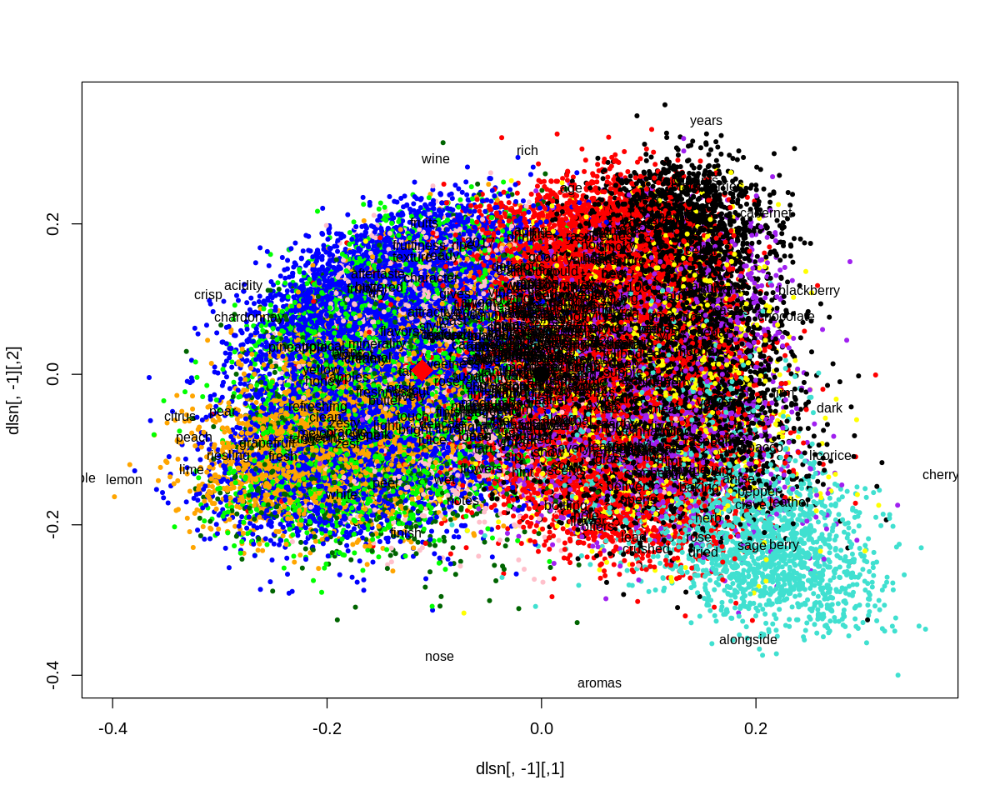

In [651]:
plot( dlsn[,-1], pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto[,-1], labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(SauvignonBlancQuery$ls)[2],normrows(SauvignonBlancQuery$ls)[3],cex=3,pch=18,col="red")

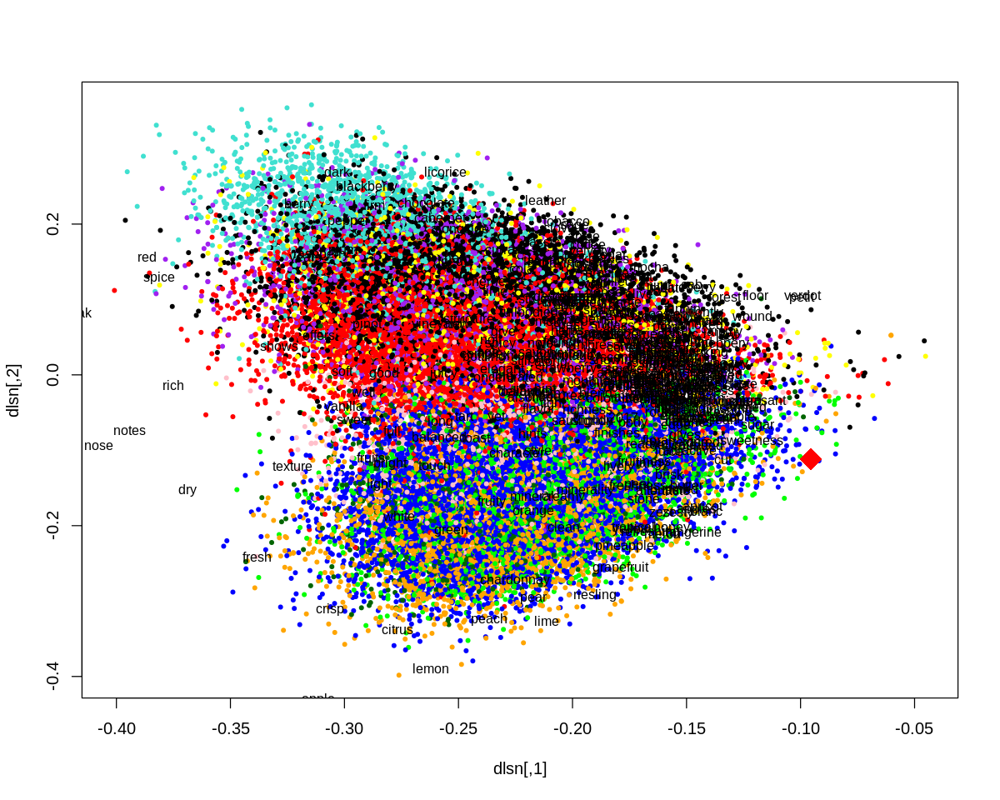

In [652]:
plot( dlsn, pch=20, cex=0.8, col=damcols )
text( tlsn_ridotto, labels=words_ridotto, cex=0.8 )
points( 0, 0, pch=20, cex=3 )
points(normrows(SauvignonBlancQuery$ls),cex=3,pch=18,col="red")

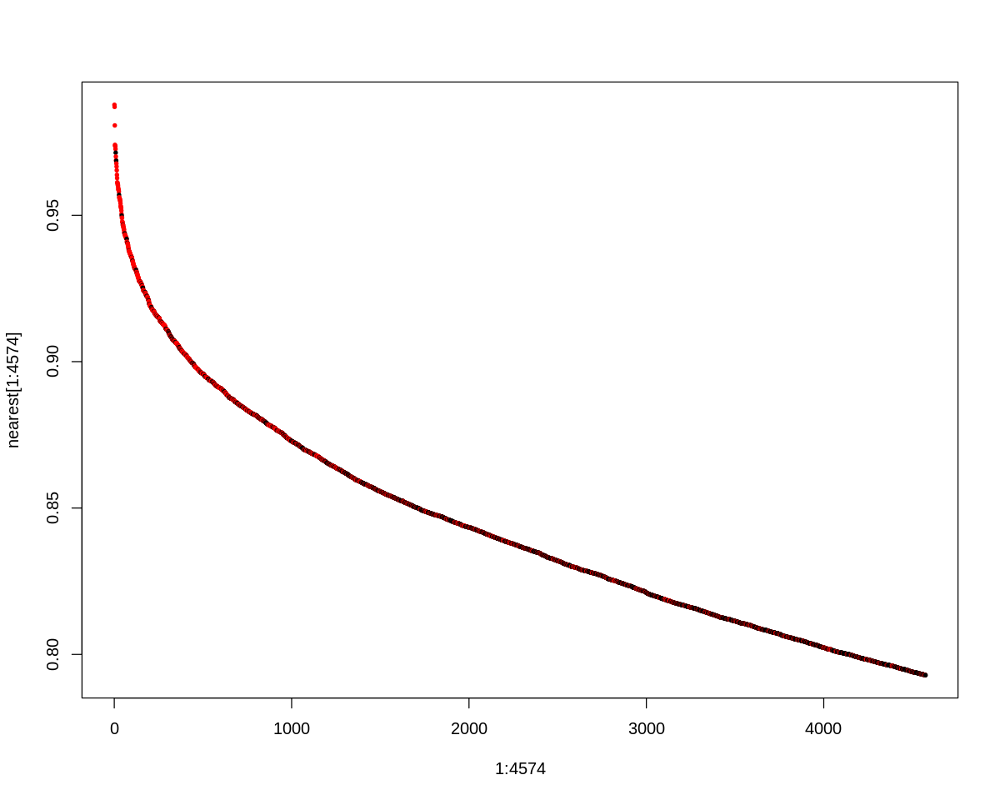

In [653]:
nearest <- sort( cosines( dls[,1:6], SauvignonBlancQuery$ls[1:6] ), decreasing=T )

damcols2 <- rep( "black", length(variety) )
damcols2[ variety == "Sauvignon Blanc" ] <- "red" 

plot( 1:4574, nearest[1:4574], pch=20, cex=0.7, col=damcols2[strtoi(names(nearest))] )

In [654]:
SauvignonBlancQuery.vs.SauvignonBlanc <- table(1:nrow(dls) %in% top(cosines(dls[,1:6], SauvignonBlancQuery$ls[1:6]), 4574), variety=="Sauvignon Blanc" )
dimnames(SauvignonBlancQuery.vs.SauvignonBlanc) <- list(SauvignonBlancQuery = c("No", "Si"), SauvignonBlanc = c("No", "Si"))
SauvignonBlancQuery.vs.SauvignonBlanc

c = chisq.test( SauvignonBlancQuery.vs.SauvignonBlanc, correct=FALSE )
c$expected
c$p.value

                   SauvignonBlanc
SauvignonBlancQuery    No    Si
                 No 49353  2705
                 Si  2705  1869

,No,Si
No,47853.429,4204.5715
Si,4204.571,369.4285


[1] 0